In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
from  matplotlib.colors import LinearSegmentedColormap
import pandas as pd
import seaborn as sn
import sys
from pathlib import Path
from tqdm import tqdm
import scipy
import os

import torch.nn as nn
from torch import Tensor
import torch
import torch.nn.functional as F
from torch.utils.data import DataLoader
import torch.optim as optim

from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix

from scipy.stats import wasserstein_distance
from sklearn.metrics import roc_auc_score as roc_auc_score
from scipy.special import kl_div as kl_div
from sklearn.metrics import log_loss as log_loss
from torchmetrics.classification import BinaryCalibrationError

# import custom functions from src folder
module_path = str(Path.cwd() / "../../../src")

if module_path not in sys.path:
    sys.path.append(module_path)

from SequentialNet import SequentialNet
from machine_learning import *
from util import *

In [2]:
def word_to_int(df):
    # Red = 0, blue = 1
    df["class"] = 0
    df_copy = df.copy()
    mask = df_copy["color"] == "blue"
    df.loc[mask, "class"] = 1
    return df


In [3]:
def predict_grid(model, x1_key, x2_key, device, mcdropout:bool = False, nx:int = 100, n_MC:int = 100):
    x1_lim = 25
    x2_lim = 25
    x1 = np.linspace(-x1_lim, x1_lim, nx)
    x2 = np.linspace(-x2_lim, x2_lim, nx)
    xx1, xx2 = np.meshgrid(x1, x2)
    df = pd.DataFrame(columns = ["x1", "x2"], index = range(len(xx1.flatten())))
    df["x1"] = xx1.flatten()
    df["x2"] = xx2.flatten()
    df = cartesian_to_polar_df(df, "x1", "x2", "r_x", "a_x")

    X_gridtest = torch.Tensor(np.dstack((df[x1_key], df[x2_key]))).to(torch.float32)[0]
    Y_gridtest = torch.zeros(X_gridtest.shape)
    gridtest_dataset = torch.utils.data.TensorDataset(X_gridtest, Y_gridtest)
    if mcdropout:
        mean_val, variance_val = mc_predictions(model, gridtest_dataset, 2**8, n_MC, 2, len(df), )
        #Get average softmax score for blue
        df["Confidence_MC"] = mean_val[:,-1]
        df["Prediction_MC"] = np.argmax(mean_val, axis=-1).flatten()
        # Error is the same for both scores
        df["Std_MC"] = np.sqrt(variance_val[:,1])
    else:
        truth, logits = predict_classifier(model, gridtest_dataset, 2, 100, device)
        preds = torch.argmax(logits, dim=-1).flatten()
        df["Prediction"] = preds
        #Get softmax score for red
        df["Confidence"] = torch.softmax(logits, dim=-1)[:,1]
    return df

In [4]:
def predict_MCD(model, df, test_dataset, device, n_MC:int = 100):
     # Predict with just model
    df_new = df.copy()
    truth, logits = predict_classifier(model, test_dataset, 2, 100, device)
    preds = torch.argmax(logits, dim=-1).flatten()
    df_new["Prediction"] = preds
    df_new["Truth"] = truth

    #Get softmax score for blue
    df_new["Confidence"] = torch.softmax(logits, dim=-1)[:,1]

    # Predict with MC dropout
    mean_val, variance_val = mc_predictions(model, test_dataset, 2**8, n_MC, 2, len(test_dataset))
    df_new["Prediction_MC"] = np.argmax(mean_val, axis=-1).flatten()
    df_new["Confidence_MC"] = mean_val[:,-1]
    # Error is the same for both scores
    df_new["Std_MC"] = np.sqrt(variance_val[:,0])
    return df_new

In [5]:
# Set up device
device = (
    "cuda:0"
    if torch.cuda.is_available()
    else "mps"
    if torch.backends.mps.is_available()
    else "cpu"
)
print(f"Using {device} device {torch.cuda.get_device_name(0)}")

Using cuda:0 device NVIDIA TITAN V


In [6]:
# Machine learning options
x1_key = "x1"
x2_key = "x2"
#n_data = [10, 50]

load_values = False
save_values = True

#Data constants
R2 = 3
k_red = 7
k_blue = 3
R1_min = 6
scale = 1
vary_a1 = False
vary_R2 = False
p_red = 0.5
polar = False
tag = f'r2_{R2}_kr{k_red}_kb{k_blue}_r1min{R1_min}_s{scale}_vary_r2_{vary_R2}_vary_a1_{vary_a1}_pRed_{p_red}'

# Read files
train_n = 50000
trainfile = f"train_n_{train_n}_{tag}"
valfile = f"val_n_5000_{tag}"
testfile = f"test_n_10000_{tag}"
truthfile = f"analytical_solution_x1_x2_grid_{tag}_nr1MC_4000"
truthfile_test = "analytical_solution_test_n_10000_r2_3_kr7_kb3_r1min6_s1_vary_r2_False_vary_a1_False_pRed_0.5_nr1MC_8000"
gridfile = f"x1_x2_grid"

train_data = pd.read_csv(f"../data/{trainfile}.csv")
val_data = pd.read_csv(f"../data/{valfile}.csv")
test_data = pd.read_csv(f"../data/{testfile}.csv")
truth_data = pd.read_csv(f"../analytical/results/{truthfile}.csv")
truth_data = truth_data[truth_data["r_x"] > R1_min-R2] # Remove undefined area
truth_test_data = pd.read_csv(f"../analytical/results/{truthfile_test}.csv")
grid_data = pd.read_csv(f"../data/{gridfile}.csv")


#Correct analytical solution if class distribution is not equal
if p_red != 0.5:
    truth_data["P_red_and_x"] = truth_data["P_red_and_x"]*(p_red)/0.5
    truth_data["P_blue_and_x"] = truth_data["P_blue_and_x"]*(1-p_red)/0.5
    truth_data["P_x"] = truth_data["P_red_and_x"] + truth_data["P_blue_and_x"]
    truth_data["P_red_given_x"] = truth_data["P_red_and_x"]/truth_data["P_x"]
    truth_data["P_blue_given_x"] = truth_data["P_blue_and_x"]/truth_data["P_x"]

# Prepare data for pytorch
train_data = word_to_int(train_data)
val_data = word_to_int(val_data)
test_data = word_to_int(test_data)

X_train = torch.Tensor(np.dstack((train_data[x1_key], train_data[x2_key]))).to(torch.float32)[0]
Y_train = label_maker(train_data["class"], 2)

X_val = torch.Tensor(np.dstack((val_data[x1_key], val_data[x2_key]))).to(torch.float32)[0]
Y_val = label_maker(val_data["class"], 2)

X_test = torch.Tensor(np.dstack((test_data[x1_key], test_data[x2_key]))).to(torch.float32)[0]
Y_test = torch.zeros(X_test.shape)

X_grid = torch.Tensor(np.dstack((grid_data[x1_key], grid_data[x2_key]))).to(torch.float32)[0]
Y_grid = torch.zeros(X_grid.shape)

In [7]:
# Create datasets for pytorch
train_dataset = torch.utils.data.TensorDataset(X_train, Y_train)
val_dataset = torch.utils.data.TensorDataset(X_val, Y_val)
test_dataset = torch.utils.data.TensorDataset(X_test, Y_test)
grid_dataset = torch.utils.data.TensorDataset(X_grid, Y_grid)

### Increasing number of datapoints

In [8]:
drop_out_rate = 0.3
n_MC=200
epochs=250
patience = 30
lr = 0.01
n_data = [250, 500, 1000, 2000, 3000, 5000, 10000]
bs_list = [250, 500, 1000, 2000, 3000, 5000, 10000]
max_err_val = [0]*len(n_data)
for i in range(len(n_data)):
    if n_data[i] < 1000:
        max_err_val[i] = 0.5
    else:
        max_err_val[i] = 0.25

test_dfs = [0]*len(n_data)
grid_dfs = [0]*len(n_data)

val_df = pd.read_csv(f"../data/{valfile}.csv")
test_df = pd.read_csv(f"../data/{testfile}.csv")
grid_df = pd.read_csv(f"../data/{gridfile}.csv")

if load_values==False:
    for i in range(len(n_data)):
        logloss_min = 1
        n_train = n_data[i]
        batchsize = bs_list[i]
        for j in tqdm(range(20)):
            # Create datasets for pytorch
            train_dataset = torch.utils.data.TensorDataset(X_train[0:n_train], Y_train[0:n_train])

            # Create model
            model = SequentialNet(L=200, n_hidden=5, activation="relu", in_channels=2, out_channels=2, p=drop_out_rate).to(device)
            optimizer = optim.Adam(model.parameters(), lr=lr)

            # Train model
            training_results = train_classifier(model, train_dataset, 
                                    val_dataset, batchsize=batchsize, epochs = epochs, 
                                    device = device, optimizer = optimizer, early_stopping=patience)
            # Predict on val set
            val_df = predict_MCD(model, val_df, val_dataset, device, n_MC=20)
            ll = log_loss(val_df["class"], val_df["Confidence_MC"])
            preds = torch.Tensor(val_df["Confidence_MC"])
            target = torch.Tensor(val_df["class"])
            bce_l1 = BinaryCalibrationError(n_bins=15, norm='l1')
            ece = bce_l1(preds, target).item()
            print(f"n_train = {n_data[i]}, logloss={ll}, ECE= {ece}")

            if ll < logloss_min:
                print(f"New best values: n_train = {n_data[i]}, logloss={ll}, ECE= {ece}")
                logloss_min = ll
                # Predict
                test_dfs[i] = predict_MCD(model, test_df, test_dataset, device, n_MC=n_MC)
                grid_dfs[i] = predict_MCD(model, grid_df, grid_dataset, device, n_MC=n_MC)

        # Save prediction
        if save_values:
            if (not os.path.isdir(f"predictions/{trainfile}") ):
                os.mkdir(f"predictions/{trainfile}")
            test_dfs[i].to_csv(f"predictions/{trainfile}/{testfile}_predicted_SequentialNet_small_MCD_pd{drop_out_rate}_nMC_{n_MC}_Vndata-{n_data[i]}.csv")
            grid_dfs[i].to_csv(f"predictions/{trainfile}/grid_{tag}_predicted_SequentialNet_small_MCD_pd{drop_out_rate}_nMC_{n_MC}_Vndata-{n_data[i]}.csv")
else:
    for i in range(len(n_data)):
    #val_data_ensembles = [pd.read_csv(f"predictions/{trainfile}/{valfile}_predicted_SequentialNet_{n_ensemble}ensembles_ndata-{n_data[i]}.csv") for i in range(len(n_data))]
        test_dfs[i] = pd.read_csv(f"predictions/{trainfile}/{testfile}_predicted_SequentialNet_small_MCD_pd{drop_out_rate}_nMC_{n_MC}_Vndata-{n_data[i]}.csv")
        grid_dfs[i] = pd.read_csv(f"predictions/{trainfile}/grid_{tag}_predicted_SequentialNet_small_MCD_pd{drop_out_rate}_nMC_{n_MC}_Vndata-{n_data[i]}.csv")


 24%|██▎       | 59/250 [00:02<00:08, 22.29it/s]


Stopping training early at epoch 59


100%|██████████| 50/50 [00:00<00:00, 484.77it/s]


Starting MC dropout inference: 


100%|██████████| 20/20 [00:01<00:00, 13.03it/s]


n_train = 250, logloss=0.6183299488070803, ECE= 0.06320790201425552
New best values: n_train = 250, logloss=0.6183299488070803, ECE= 0.06320790201425552


100%|██████████| 100/100 [00:00<00:00, 488.88it/s]


Starting MC dropout inference: 


100%|██████████| 100/100 [00:00<00:00, 491.61it/s]


Starting MC dropout inference: 


 56%|█████▌    | 139/250 [00:05<00:04, 24.25it/s]


Stopping training early at epoch 139


100%|██████████| 50/50 [00:00<00:00, 506.81it/s]


Starting MC dropout inference: 


100%|██████████| 20/20 [00:01<00:00, 13.30it/s]


n_train = 250, logloss=0.5645450019245452, ECE= 0.05948476493358612
New best values: n_train = 250, logloss=0.5645450019245452, ECE= 0.05948476493358612


100%|██████████| 100/100 [00:00<00:00, 502.24it/s]


Starting MC dropout inference: 


100%|██████████| 100/100 [00:00<00:00, 502.17it/s]


Starting MC dropout inference: 


 40%|███▉      | 99/250 [00:04<00:06, 24.36it/s]


Stopping training early at epoch 99


100%|██████████| 50/50 [00:00<00:00, 500.07it/s]


Starting MC dropout inference: 


 15%|█▌        | 3/20 [02:26<11:36, 40.95s/it]

n_train = 250, logloss=0.5698039647705688, ECE= 0.03878828510642052


 28%|██▊       | 69/250 [00:02<00:07, 23.34it/s]


Stopping training early at epoch 69


100%|██████████| 50/50 [00:00<00:00, 488.59it/s]


Starting MC dropout inference: 


 20%|██        | 4/20 [02:31<07:05, 26.60s/it]

n_train = 250, logloss=0.6073799401243889, ECE= 0.03335464000701904


 36%|███▌      | 89/250 [00:03<00:06, 24.23it/s]


Stopping training early at epoch 89


100%|██████████| 50/50 [00:00<00:00, 489.79it/s]


Starting MC dropout inference: 


 25%|██▌       | 5/20 [02:36<04:43, 18.93s/it]

n_train = 250, logloss=0.5728007824756094, ECE= 0.03548721969127655


 52%|█████▏    | 129/250 [00:05<00:05, 24.04it/s]


Stopping training early at epoch 129


100%|██████████| 50/50 [00:00<00:00, 487.74it/s]


Starting MC dropout inference: 


100%|██████████| 20/20 [00:01<00:00, 12.17it/s]


n_train = 250, logloss=0.563947739280686, ECE= 0.06773442029953003
New best values: n_train = 250, logloss=0.563947739280686, ECE= 0.06773442029953003


100%|██████████| 100/100 [00:00<00:00, 488.75it/s]


Starting MC dropout inference: 


100%|██████████| 100/100 [00:00<00:00, 481.26it/s]


Starting MC dropout inference: 


 52%|█████▏    | 129/250 [00:05<00:04, 24.38it/s]


Stopping training early at epoch 129


100%|██████████| 50/50 [00:00<00:00, 502.93it/s]


Starting MC dropout inference: 


100%|██████████| 20/20 [00:01<00:00, 13.27it/s]


n_train = 250, logloss=0.5489297075189283, ECE= 0.04950789734721184
New best values: n_train = 250, logloss=0.5489297075189283, ECE= 0.04950789734721184


100%|██████████| 100/100 [00:00<00:00, 497.86it/s]


Starting MC dropout inference: 


100%|██████████| 100/100 [00:00<00:00, 500.51it/s]


Starting MC dropout inference: 


 52%|█████▏    | 129/250 [00:05<00:04, 24.55it/s]


Stopping training early at epoch 129


100%|██████████| 50/50 [00:00<00:00, 476.93it/s]


Starting MC dropout inference: 


 40%|████      | 8/20 [05:05<06:58, 34.89s/it]

n_train = 250, logloss=0.5623680299604635, ECE= 0.05052124336361885


 52%|█████▏    | 129/250 [00:05<00:04, 24.57it/s]


Stopping training early at epoch 129


100%|██████████| 50/50 [00:00<00:00, 501.18it/s]


Starting MC dropout inference: 


 45%|████▌     | 9/20 [05:12<04:47, 26.14s/it]

n_train = 250, logloss=0.5518046426203506, ECE= 0.037454839795827866


 52%|█████▏    | 129/250 [00:05<00:05, 24.11it/s]


Stopping training early at epoch 129


100%|██████████| 50/50 [00:00<00:00, 501.39it/s]


Starting MC dropout inference: 


 50%|█████     | 10/20 [05:19<03:22, 20.23s/it]

n_train = 250, logloss=0.5659059524097962, ECE= 0.06839697808027267


 68%|██████▊   | 169/250 [00:06<00:03, 24.83it/s]


Stopping training early at epoch 169


100%|██████████| 50/50 [00:00<00:00, 507.91it/s]


Starting MC dropout inference: 


 55%|█████▌    | 11/20 [05:28<02:29, 16.62s/it]

n_train = 250, logloss=0.5649683814858293, ECE= 0.04756489023566246


 32%|███▏      | 79/250 [00:03<00:06, 24.79it/s]


Stopping training early at epoch 79


100%|██████████| 50/50 [00:00<00:00, 501.35it/s]


Starting MC dropout inference: 


 60%|██████    | 12/20 [05:33<01:44, 13.08s/it]

n_train = 250, logloss=0.5598300512173191, ECE= 0.03515171632170677


 24%|██▎       | 59/250 [00:02<00:07, 24.52it/s]


Stopping training early at epoch 59


100%|██████████| 50/50 [00:00<00:00, 502.21it/s]


Starting MC dropout inference: 


 65%|██████▌   | 13/20 [05:37<01:12, 10.34s/it]

n_train = 250, logloss=0.597684730346768, ECE= 0.05137372016906738


 32%|███▏      | 79/250 [00:03<00:06, 24.69it/s]


Stopping training early at epoch 79


100%|██████████| 50/50 [00:00<00:00, 504.11it/s]


Starting MC dropout inference: 


 70%|███████   | 14/20 [05:42<00:52,  8.72s/it]

n_train = 250, logloss=0.5915529685114745, ECE= 0.06614020466804504


 32%|███▏      | 79/250 [00:03<00:06, 24.67it/s]


Stopping training early at epoch 79


100%|██████████| 50/50 [00:00<00:00, 503.44it/s]


Starting MC dropout inference: 


 75%|███████▌  | 15/20 [05:46<00:37,  7.55s/it]

n_train = 250, logloss=0.5910782961420136, ECE= 0.02958199754357338


 32%|███▏      | 79/250 [00:03<00:06, 24.65it/s]


Stopping training early at epoch 79


100%|██████████| 50/50 [00:00<00:00, 502.63it/s]


Starting MC dropout inference: 


 80%|████████  | 16/20 [05:51<00:26,  6.74s/it]

n_train = 250, logloss=0.5784219613626973, ECE= 0.08328552544116974


 28%|██▊       | 69/250 [00:02<00:07, 23.52it/s]


Stopping training early at epoch 69


100%|██████████| 50/50 [00:00<00:00, 504.63it/s]


Starting MC dropout inference: 


 85%|████████▌ | 17/20 [05:56<00:18,  6.08s/it]

n_train = 250, logloss=0.6169570694001506, ECE= 0.05929296463727951


 20%|█▉        | 49/250 [00:01<00:08, 24.50it/s]


Stopping training early at epoch 49


100%|██████████| 50/50 [00:00<00:00, 501.15it/s]


Starting MC dropout inference: 


 90%|█████████ | 18/20 [05:59<00:10,  5.35s/it]

n_train = 250, logloss=0.612182804115354, ECE= 0.09452509880065918


 56%|█████▌    | 139/250 [00:05<00:04, 24.82it/s]


Stopping training early at epoch 139


100%|██████████| 50/50 [00:00<00:00, 504.45it/s]


Starting MC dropout inference: 


 95%|█████████▌| 19/20 [06:07<00:05,  5.96s/it]

n_train = 250, logloss=0.5506471255199893, ECE= 0.032495785504579544


 28%|██▊       | 69/250 [00:02<00:07, 24.55it/s]


Stopping training early at epoch 69


100%|██████████| 50/50 [00:00<00:00, 502.31it/s]


Starting MC dropout inference: 


100%|██████████| 20/20 [06:11<00:00, 18.59s/it]


n_train = 250, logloss=0.5993098244644323, ECE= 0.05641650781035423


 24%|██▎       | 59/250 [00:04<00:14, 12.75it/s]


Stopping training early at epoch 59


100%|██████████| 50/50 [00:00<00:00, 501.21it/s]


Starting MC dropout inference: 


100%|██████████| 20/20 [00:01<00:00, 12.00it/s]


n_train = 500, logloss=0.6100048242981478, ECE= 0.07257618010044098
New best values: n_train = 500, logloss=0.6100048242981478, ECE= 0.07257618010044098


100%|██████████| 100/100 [00:00<00:00, 497.51it/s]


Starting MC dropout inference: 


100%|██████████| 100/100 [00:00<00:00, 494.21it/s]


Starting MC dropout inference: 


 60%|█████▉    | 149/250 [00:11<00:07, 12.99it/s]


Stopping training early at epoch 149


100%|██████████| 50/50 [00:00<00:00, 502.28it/s]


Starting MC dropout inference: 


100%|██████████| 20/20 [00:01<00:00, 13.21it/s]


n_train = 500, logloss=0.5417317852091222, ECE= 0.03868664428591728
New best values: n_train = 500, logloss=0.5417317852091222, ECE= 0.03868664428591728


100%|██████████| 100/100 [00:00<00:00, 499.61it/s]


Starting MC dropout inference: 


100%|██████████| 100/100 [00:00<00:00, 498.64it/s]


Starting MC dropout inference: 


 16%|█▌        | 39/250 [00:03<00:16, 12.89it/s]


Stopping training early at epoch 39


100%|██████████| 50/50 [00:00<00:00, 477.16it/s]


Starting MC dropout inference: 


 15%|█▌        | 3/20 [02:32<12:03, 42.58s/it]

n_train = 500, logloss=0.6388822788622772, ECE= 0.10515762865543365


 32%|███▏      | 79/250 [00:06<00:13, 12.78it/s]


Stopping training early at epoch 79


100%|██████████| 50/50 [00:00<00:00, 503.21it/s]


Starting MC dropout inference: 


 20%|██        | 4/20 [02:40<07:41, 28.85s/it]

n_train = 500, logloss=0.5745743281792093, ECE= 0.0697273313999176


 48%|████▊     | 119/250 [00:09<00:10, 13.09it/s]


Stopping training early at epoch 119


100%|██████████| 50/50 [00:00<00:00, 503.68it/s]


Starting MC dropout inference: 


100%|██████████| 20/20 [00:01<00:00, 12.28it/s]


n_train = 500, logloss=0.5408990642658615, ECE= 0.04246643930673599
New best values: n_train = 500, logloss=0.5408990642658615, ECE= 0.04246643930673599


100%|██████████| 100/100 [00:00<00:00, 498.54it/s]


Starting MC dropout inference: 


100%|██████████| 100/100 [00:00<00:00, 491.97it/s]


Starting MC dropout inference: 


 16%|█▌        | 39/250 [00:03<00:16, 12.81it/s]


Stopping training early at epoch 39


100%|██████████| 50/50 [00:00<00:00, 473.24it/s]


Starting MC dropout inference: 


 30%|███       | 6/20 [04:00<07:24, 31.75s/it]

n_train = 500, logloss=0.6490313460043848, ECE= 0.07554008811712265


 60%|█████▉    | 149/250 [00:11<00:07, 12.86it/s]


Stopping training early at epoch 149


100%|██████████| 50/50 [00:00<00:00, 502.00it/s]


Starting MC dropout inference: 


 35%|███▌      | 7/20 [04:13<05:34, 25.69s/it]

n_train = 500, logloss=0.5456908749728303, ECE= 0.03611064329743385


 60%|█████▉    | 149/250 [00:11<00:07, 13.10it/s]


Stopping training early at epoch 149


100%|██████████| 50/50 [00:00<00:00, 500.94it/s]


Starting MC dropout inference: 


 40%|████      | 8/20 [04:26<04:20, 21.71s/it]

n_train = 500, logloss=0.5516177004904602, ECE= 0.045933227986097336


 32%|███▏      | 79/250 [00:06<00:13, 13.00it/s]


Stopping training early at epoch 79


100%|██████████| 50/50 [00:00<00:00, 407.96it/s]


Starting MC dropout inference: 


 45%|████▌     | 9/20 [04:34<03:10, 17.34s/it]

n_train = 500, logloss=0.5906133041882092, ECE= 0.08535788953304291


 44%|████▎     | 109/250 [00:08<00:10, 12.89it/s]


Stopping training early at epoch 109


100%|██████████| 50/50 [00:00<00:00, 500.66it/s]


Starting MC dropout inference: 


 50%|█████     | 10/20 [04:44<02:31, 15.10s/it]

n_train = 500, logloss=0.5631461604942292, ECE= 0.04699019715189934


 32%|███▏      | 79/250 [00:06<00:13, 12.91it/s]


Stopping training early at epoch 79


100%|██████████| 50/50 [00:00<00:00, 488.37it/s]


Starting MC dropout inference: 


 55%|█████▌    | 11/20 [04:52<01:56, 12.91s/it]

n_train = 500, logloss=0.5725245231104711, ECE= 0.07200905680656433


 28%|██▊       | 69/250 [00:05<00:13, 12.99it/s]


Stopping training early at epoch 69


100%|██████████| 50/50 [00:00<00:00, 500.67it/s]


Starting MC dropout inference: 


 60%|██████    | 12/20 [04:59<01:28, 11.10s/it]

n_train = 500, logloss=0.6116674048034733, ECE= 0.06227459758520126


 36%|███▌      | 89/250 [00:06<00:12, 12.72it/s]


Stopping training early at epoch 89


100%|██████████| 50/50 [00:00<00:00, 488.67it/s]


Starting MC dropout inference: 


 65%|██████▌   | 13/20 [05:08<01:12, 10.36s/it]

n_train = 500, logloss=0.5801690841478999, ECE= 0.05863866209983826


 80%|███████▉  | 199/250 [00:15<00:03, 12.97it/s]


Stopping training early at epoch 199


100%|██████████| 50/50 [00:00<00:00, 502.44it/s]


Starting MC dropout inference: 


 70%|███████   | 14/20 [05:25<01:14, 12.36s/it]

n_train = 500, logloss=0.544086436001275, ECE= 0.03748128563165665


 40%|███▉      | 99/250 [00:07<00:11, 12.83it/s]


Stopping training early at epoch 99


100%|██████████| 50/50 [00:00<00:00, 503.33it/s]


Starting MC dropout inference: 


 75%|███████▌  | 15/20 [05:34<00:57, 11.45s/it]

n_train = 500, logloss=0.5752382456460533, ECE= 0.07801319658756256


 56%|█████▌    | 139/250 [00:10<00:08, 13.06it/s]


Stopping training early at epoch 139


100%|██████████| 50/50 [00:00<00:00, 499.25it/s]


Starting MC dropout inference: 


 80%|████████  | 16/20 [05:47<00:47, 11.75s/it]

n_train = 500, logloss=0.5496245443590181, ECE= 0.05231719836592674


 60%|█████▉    | 149/250 [00:11<00:07, 12.92it/s]


Stopping training early at epoch 149


100%|██████████| 50/50 [00:00<00:00, 503.01it/s]


Starting MC dropout inference: 


 85%|████████▌ | 17/20 [06:00<00:36, 12.18s/it]

n_train = 500, logloss=0.5555911931711968, ECE= 0.030763953924179077


 28%|██▊       | 69/250 [00:05<00:13, 13.05it/s]


Stopping training early at epoch 69


100%|██████████| 50/50 [00:00<00:00, 501.61it/s]


Starting MC dropout inference: 


 90%|█████████ | 18/20 [06:07<00:21, 10.60s/it]

n_train = 500, logloss=0.6081247220633382, ECE= 0.09285281598567963


 20%|█▉        | 49/250 [00:03<00:15, 12.58it/s]


Stopping training early at epoch 49


100%|██████████| 50/50 [00:00<00:00, 502.19it/s]


Starting MC dropout inference: 


 95%|█████████▌| 19/20 [06:12<00:09,  9.08s/it]

n_train = 500, logloss=0.6344419232093366, ECE= 0.07209344953298569


 60%|█████▉    | 149/250 [00:11<00:07, 12.89it/s]


Stopping training early at epoch 149


100%|██████████| 50/50 [00:00<00:00, 500.80it/s]


Starting MC dropout inference: 


100%|██████████| 20/20 [00:01<00:00, 13.19it/s]


n_train = 500, logloss=0.5401885238437968, ECE= 0.05546248331665993
New best values: n_train = 500, logloss=0.5401885238437968, ECE= 0.05546248331665993


100%|██████████| 100/100 [00:00<00:00, 500.10it/s]


Starting MC dropout inference: 


100%|██████████| 100/100 [00:00<00:00, 492.25it/s]


Starting MC dropout inference: 


 68%|██████▊   | 169/250 [00:25<00:12,  6.62it/s]


Stopping training early at epoch 169


100%|██████████| 50/50 [00:00<00:00, 502.38it/s]


Starting MC dropout inference: 


100%|██████████| 20/20 [00:01<00:00, 13.17it/s]


n_train = 1000, logloss=0.5315660721799893, ECE= 0.0494992770254612
New best values: n_train = 1000, logloss=0.5315660721799893, ECE= 0.0494992770254612


100%|██████████| 100/100 [00:00<00:00, 484.97it/s]


Starting MC dropout inference: 


100%|██████████| 100/100 [00:00<00:00, 498.21it/s]


Starting MC dropout inference: 


 32%|███▏      | 79/250 [00:11<00:25,  6.60it/s]


Stopping training early at epoch 79


100%|██████████| 50/50 [00:00<00:00, 501.68it/s]


Starting MC dropout inference: 


 10%|█         | 2/20 [01:44<13:39, 45.55s/it]

n_train = 1000, logloss=0.5767060010875245, ECE= 0.07774936407804489


 92%|█████████▏| 229/250 [00:34<00:03,  6.69it/s]


Stopping training early at epoch 229


100%|██████████| 50/50 [00:00<00:00, 500.64it/s]


Starting MC dropout inference: 


100%|██████████| 20/20 [00:01<00:00, 13.20it/s]


n_train = 1000, logloss=0.5286873704216661, ECE= 0.03895503282546997
New best values: n_train = 1000, logloss=0.5286873704216661, ECE= 0.03895503282546997


100%|██████████| 100/100 [00:00<00:00, 499.81it/s]


Starting MC dropout inference: 


100%|██████████| 100/100 [00:00<00:00, 497.08it/s]


Starting MC dropout inference: 


 24%|██▎       | 59/250 [00:08<00:28,  6.63it/s]


Stopping training early at epoch 59


100%|██████████| 50/50 [00:00<00:00, 501.96it/s]


Starting MC dropout inference: 


 20%|██        | 4/20 [03:35<12:28, 46.77s/it]

n_train = 1000, logloss=0.5791253315427745, ECE= 0.09036900848150253


 20%|█▉        | 49/250 [00:07<00:30,  6.57it/s]


Stopping training early at epoch 49


100%|██████████| 50/50 [00:00<00:00, 502.09it/s]


Starting MC dropout inference: 


 25%|██▌       | 5/20 [03:44<08:17, 33.18s/it]

n_train = 1000, logloss=0.5875177778779248, ECE= 0.10580382496118546


 24%|██▎       | 59/250 [00:08<00:28,  6.63it/s]


Stopping training early at epoch 59


100%|██████████| 50/50 [00:00<00:00, 501.38it/s]


Starting MC dropout inference: 


 30%|███       | 6/20 [03:55<05:57, 25.53s/it]

n_train = 1000, logloss=0.5744520670504194, ECE= 0.08586206287145615


 24%|██▎       | 59/250 [00:08<00:28,  6.63it/s]


Stopping training early at epoch 59


100%|██████████| 50/50 [00:00<00:00, 502.24it/s]


Starting MC dropout inference: 


 35%|███▌      | 7/20 [04:05<04:28, 20.63s/it]

n_train = 1000, logloss=0.5731514834772663, ECE= 0.08299291133880615


 24%|██▎       | 59/250 [00:09<00:29,  6.55it/s]


Stopping training early at epoch 59


100%|██████████| 50/50 [00:00<00:00, 500.58it/s]


Starting MC dropout inference: 


 40%|████      | 8/20 [04:16<03:29, 17.45s/it]

n_train = 1000, logloss=0.5669039025187422, ECE= 0.09858310222625732


 32%|███▏      | 79/250 [00:11<00:25,  6.68it/s]


Stopping training early at epoch 79


100%|██████████| 50/50 [00:00<00:00, 502.31it/s]


Starting MC dropout inference: 


 45%|████▌     | 9/20 [04:29<02:58, 16.24s/it]

n_train = 1000, logloss=0.5631190473432476, ECE= 0.08571551740169525


 20%|█▉        | 49/250 [00:07<00:30,  6.59it/s]


Stopping training early at epoch 49


100%|██████████| 50/50 [00:00<00:00, 503.74it/s]


Starting MC dropout inference: 


 50%|█████     | 10/20 [04:38<02:20, 14.03s/it]

n_train = 1000, logloss=0.5794186843774036, ECE= 0.08900271356105804


 36%|███▌      | 89/250 [00:13<00:24,  6.69it/s]


Stopping training early at epoch 89


100%|██████████| 50/50 [00:00<00:00, 501.05it/s]


Starting MC dropout inference: 


 55%|█████▌    | 11/20 [04:53<02:09, 14.34s/it]

n_train = 1000, logloss=0.5711613878803224, ECE= 0.09052079916000366


 24%|██▎       | 59/250 [00:08<00:28,  6.63it/s]


Stopping training early at epoch 59


100%|██████████| 50/50 [00:00<00:00, 500.33it/s]


Starting MC dropout inference: 


 60%|██████    | 12/20 [05:04<01:45, 13.19s/it]

n_train = 1000, logloss=0.5775703558692462, ECE= 0.08983106911182404


 28%|██▊       | 69/250 [00:10<00:27,  6.64it/s]


Stopping training early at epoch 69


100%|██████████| 50/50 [00:00<00:00, 501.03it/s]


Starting MC dropout inference: 


 65%|██████▌   | 13/20 [05:16<01:30, 12.87s/it]

n_train = 1000, logloss=0.5710976094683116, ECE= 0.10691449791193008


 32%|███▏      | 79/250 [00:11<00:25,  6.62it/s]


Stopping training early at epoch 79


100%|██████████| 50/50 [00:00<00:00, 503.12it/s]


Starting MC dropout inference: 


 70%|███████   | 14/20 [05:30<01:18, 13.12s/it]

n_train = 1000, logloss=0.5718383790906618, ECE= 0.1000877320766449


 24%|██▎       | 59/250 [00:08<00:28,  6.61it/s]


Stopping training early at epoch 59


100%|██████████| 50/50 [00:00<00:00, 501.81it/s]


Starting MC dropout inference: 


 75%|███████▌  | 15/20 [05:40<01:01, 12.35s/it]

n_train = 1000, logloss=0.5683161152575511, ECE= 0.09525087475776672


 32%|███▏      | 79/250 [00:11<00:25,  6.59it/s]


Stopping training early at epoch 79


100%|██████████| 50/50 [00:00<00:00, 501.82it/s]


Starting MC dropout inference: 


 80%|████████  | 16/20 [05:54<00:50, 12.74s/it]

n_train = 1000, logloss=0.5679136733909615, ECE= 0.0984673798084259


 24%|██▎       | 59/250 [00:08<00:28,  6.60it/s]


Stopping training early at epoch 59


100%|██████████| 50/50 [00:00<00:00, 501.12it/s]


Starting MC dropout inference: 


 85%|████████▌ | 17/20 [06:05<00:36, 12.12s/it]

n_train = 1000, logloss=0.5802532328757459, ECE= 0.08582885563373566


 68%|██████▊   | 169/250 [00:25<00:12,  6.67it/s]


Stopping training early at epoch 169


100%|██████████| 50/50 [00:00<00:00, 502.40it/s]


Starting MC dropout inference: 


 90%|█████████ | 18/20 [06:32<00:33, 16.58s/it]

n_train = 1000, logloss=0.5338086810246719, ECE= 0.042134057730436325


 24%|██▎       | 59/250 [00:09<00:29,  6.55it/s]


Stopping training early at epoch 59


100%|██████████| 50/50 [00:00<00:00, 500.09it/s]


Starting MC dropout inference: 


 95%|█████████▌| 19/20 [06:42<00:14, 14.84s/it]

n_train = 1000, logloss=0.5736500385733522, ECE= 0.07419661432504654


 36%|███▌      | 89/250 [00:13<00:24,  6.66it/s]


Stopping training early at epoch 89


100%|██████████| 50/50 [00:00<00:00, 484.02it/s]


Starting MC dropout inference: 


100%|██████████| 20/20 [06:58<00:00, 20.91s/it]


n_train = 1000, logloss=0.5777739042788389, ECE= 0.10211282968521118


 24%|██▎       | 59/250 [00:17<00:57,  3.32it/s]


Stopping training early at epoch 59


100%|██████████| 50/50 [00:00<00:00, 507.30it/s]


Starting MC dropout inference: 


100%|██████████| 20/20 [00:01<00:00, 12.40it/s]


n_train = 2000, logloss=0.6039374842541824, ECE= 0.14538370072841644
New best values: n_train = 2000, logloss=0.6039374842541824, ECE= 0.14538370072841644


100%|██████████| 100/100 [00:00<00:00, 504.11it/s]


Starting MC dropout inference: 


100%|██████████| 100/100 [00:00<00:00, 490.83it/s]


Starting MC dropout inference: 


 20%|█▉        | 49/250 [00:14<01:00,  3.32it/s]


Stopping training early at epoch 49


100%|██████████| 50/50 [00:00<00:00, 501.93it/s]


Starting MC dropout inference: 


100%|██████████| 20/20 [00:01<00:00, 12.32it/s]


n_train = 2000, logloss=0.5554110170851987, ECE= 0.08452346175909042
New best values: n_train = 2000, logloss=0.5554110170851987, ECE= 0.08452346175909042


100%|██████████| 100/100 [00:00<00:00, 497.87it/s]


Starting MC dropout inference: 


100%|██████████| 100/100 [00:00<00:00, 492.33it/s]


Starting MC dropout inference: 


 32%|███▏      | 79/250 [00:23<00:51,  3.30it/s]


Stopping training early at epoch 79


100%|██████████| 50/50 [00:00<00:00, 502.53it/s]


Starting MC dropout inference: 


100%|██████████| 20/20 [00:01<00:00, 13.21it/s]


n_train = 2000, logloss=0.542037008968898, ECE= 0.06335461884737015
New best values: n_train = 2000, logloss=0.542037008968898, ECE= 0.06335461884737015


100%|██████████| 100/100 [00:00<00:00, 498.39it/s]


Starting MC dropout inference: 


100%|██████████| 100/100 [00:00<00:00, 492.53it/s]


Starting MC dropout inference: 


 20%|█▉        | 49/250 [00:14<01:00,  3.30it/s]


Stopping training early at epoch 49


100%|██████████| 50/50 [00:00<00:00, 502.67it/s]


Starting MC dropout inference: 


 20%|██        | 4/20 [04:30<15:32, 58.29s/it]

n_train = 2000, logloss=0.5634280832532187, ECE= 0.08284106850624084


 20%|█▉        | 49/250 [00:14<01:01,  3.29it/s]


Stopping training early at epoch 49


100%|██████████| 50/50 [00:00<00:00, 501.80it/s]


Starting MC dropout inference: 


 25%|██▌       | 5/20 [04:47<10:48, 43.23s/it]

n_train = 2000, logloss=0.5675975578476655, ECE= 0.0973072201013565


 28%|██▊       | 69/250 [00:20<00:54,  3.34it/s]


Stopping training early at epoch 69


100%|██████████| 50/50 [00:00<00:00, 501.88it/s]


Starting MC dropout inference: 


 30%|███       | 6/20 [05:09<08:26, 36.15s/it]

n_train = 2000, logloss=0.5527921044336076, ECE= 0.07448741793632507


 24%|██▎       | 59/250 [00:17<00:57,  3.35it/s]


Stopping training early at epoch 59


100%|██████████| 50/50 [00:00<00:00, 478.92it/s]


Starting MC dropout inference: 


 35%|███▌      | 7/20 [05:29<06:38, 30.67s/it]

n_train = 2000, logloss=0.5613056936714911, ECE= 0.09649095684289932


 40%|███▉      | 99/250 [00:29<00:45,  3.35it/s]


Stopping training early at epoch 99


100%|██████████| 50/50 [00:00<00:00, 501.10it/s]


Starting MC dropout inference: 


 40%|████      | 8/20 [06:00<06:10, 30.84s/it]

n_train = 2000, logloss=0.5467021145905036, ECE= 0.08230996876955032


 20%|█▉        | 49/250 [00:14<01:01,  3.27it/s]


Stopping training early at epoch 49


100%|██████████| 50/50 [00:00<00:00, 500.83it/s]


Starting MC dropout inference: 


 45%|████▌     | 9/20 [06:16<04:50, 26.40s/it]

n_train = 2000, logloss=0.5564806976877722, ECE= 0.08631512522697449


 24%|██▎       | 59/250 [00:17<00:58,  3.29it/s]


Stopping training early at epoch 59


100%|██████████| 50/50 [00:00<00:00, 502.89it/s]


Starting MC dropout inference: 


 50%|█████     | 10/20 [06:36<04:02, 24.29s/it]

n_train = 2000, logloss=0.5536377738297155, ECE= 0.08020413666963577


 24%|██▎       | 59/250 [00:19<01:02,  3.07it/s]


Stopping training early at epoch 59


100%|██████████| 50/50 [00:00<00:00, 502.30it/s]


Starting MC dropout inference: 


 55%|█████▌    | 11/20 [06:57<03:29, 23.28s/it]

n_train = 2000, logloss=0.5625770434321524, ECE= 0.08716616034507751


 24%|██▎       | 59/250 [00:18<01:00,  3.14it/s]


Stopping training early at epoch 59


100%|██████████| 50/50 [00:00<00:00, 451.48it/s]


Starting MC dropout inference: 


 60%|██████    | 12/20 [07:18<02:59, 22.44s/it]

n_train = 2000, logloss=0.5550874967865209, ECE= 0.07414964586496353


 20%|█▉        | 49/250 [00:24<01:42,  1.96it/s]


Stopping training early at epoch 49


100%|██████████| 50/50 [00:00<00:00, 449.80it/s]


Starting MC dropout inference: 


 65%|██████▌   | 13/20 [07:44<02:46, 23.72s/it]

n_train = 2000, logloss=0.5600485271700817, ECE= 0.10069011151790619


 24%|██▎       | 59/250 [00:22<01:11,  2.67it/s]


Stopping training early at epoch 59


100%|██████████| 50/50 [00:00<00:00, 500.03it/s]


Starting MC dropout inference: 


 70%|███████   | 14/20 [08:08<02:22, 23.72s/it]

n_train = 2000, logloss=0.5638200314422683, ECE= 0.08642023056745529


 24%|██▎       | 59/250 [00:17<00:57,  3.32it/s]


Stopping training early at epoch 59


100%|██████████| 50/50 [00:00<00:00, 504.72it/s]


Starting MC dropout inference: 


 75%|███████▌  | 15/20 [08:27<01:52, 22.42s/it]

n_train = 2000, logloss=0.5530864876134696, ECE= 0.08117391169071198


 36%|███▌      | 89/250 [00:26<00:48,  3.34it/s]


Stopping training early at epoch 89


100%|██████████| 50/50 [00:00<00:00, 501.24it/s]


Starting MC dropout inference: 


100%|██████████| 20/20 [00:01<00:00, 13.24it/s]


n_train = 2000, logloss=0.537889085840705, ECE= 0.07330703735351562
New best values: n_train = 2000, logloss=0.537889085840705, ECE= 0.07330703735351562


100%|██████████| 100/100 [00:00<00:00, 498.08it/s]


Starting MC dropout inference: 


100%|██████████| 100/100 [00:00<00:00, 490.89it/s]


Starting MC dropout inference: 


 20%|█▉        | 49/250 [00:14<01:00,  3.30it/s]


Stopping training early at epoch 49


100%|██████████| 50/50 [00:00<00:00, 501.10it/s]


Starting MC dropout inference: 


 85%|████████▌ | 17/20 [10:17<01:46, 35.45s/it]

n_train = 2000, logloss=0.5648784775156566, ECE= 0.09779735654592514


 20%|█▉        | 49/250 [00:14<01:01,  3.27it/s]


Stopping training early at epoch 49


100%|██████████| 50/50 [00:00<00:00, 490.36it/s]


Starting MC dropout inference: 


 90%|█████████ | 18/20 [10:33<00:59, 29.79s/it]

n_train = 2000, logloss=0.5622221857999267, ECE= 0.08381965011358261


 20%|█▉        | 49/250 [00:14<01:01,  3.27it/s]


Stopping training early at epoch 49


100%|██████████| 50/50 [00:00<00:00, 503.16it/s]


Starting MC dropout inference: 


 95%|█████████▌| 19/20 [10:50<00:25, 25.83s/it]

n_train = 2000, logloss=0.5662189430412513, ECE= 0.08967532962560654


 20%|█▉        | 49/250 [00:14<01:01,  3.27it/s]


Stopping training early at epoch 49


100%|██████████| 50/50 [00:00<00:00, 487.90it/s]


Starting MC dropout inference: 


100%|██████████| 20/20 [11:06<00:00, 33.35s/it]


n_train = 2000, logloss=0.5567469013918191, ECE= 0.07652143388986588


 32%|███▏      | 79/250 [00:35<01:17,  2.20it/s]


Stopping training early at epoch 79


100%|██████████| 50/50 [00:00<00:00, 501.19it/s]


Starting MC dropout inference: 


100%|██████████| 20/20 [00:01<00:00, 12.80it/s]


n_train = 3000, logloss=0.5428553634818881, ECE= 0.08292847871780396
New best values: n_train = 3000, logloss=0.5428553634818881, ECE= 0.08292847871780396


100%|██████████| 100/100 [00:00<00:00, 497.36it/s]


Starting MC dropout inference: 


100%|██████████| 100/100 [00:00<00:00, 486.79it/s]


Starting MC dropout inference: 


 20%|█▉        | 49/250 [00:23<01:34,  2.12it/s]


Stopping training early at epoch 49


100%|██████████| 50/50 [00:00<00:00, 487.49it/s]


Starting MC dropout inference: 


 10%|█         | 2/20 [02:07<17:05, 56.98s/it] 

n_train = 3000, logloss=0.5529730626320081, ECE= 0.08875530958175659


 24%|██▎       | 59/250 [00:27<01:29,  2.14it/s]


Stopping training early at epoch 59


100%|██████████| 50/50 [00:00<00:00, 488.22it/s]


Starting MC dropout inference: 


 15%|█▌        | 3/20 [02:36<12:33, 44.30s/it]

n_train = 3000, logloss=0.5589101332328407, ECE= 0.09409617632627487


 16%|█▌        | 39/250 [00:18<01:40,  2.11it/s]


Stopping training early at epoch 39


100%|██████████| 50/50 [00:00<00:00, 482.02it/s]


Starting MC dropout inference: 


 20%|██        | 4/20 [02:57<09:16, 34.78s/it]

n_train = 3000, logloss=0.5779091191032907, ECE= 0.1280812919139862


 36%|███▌      | 89/250 [00:40<01:14,  2.17it/s]


Stopping training early at epoch 89


100%|██████████| 50/50 [00:00<00:00, 499.56it/s]


Starting MC dropout inference: 


100%|██████████| 20/20 [00:01<00:00, 12.25it/s]


n_train = 3000, logloss=0.5420676088995368, ECE= 0.07784906774759293
New best values: n_train = 3000, logloss=0.5420676088995368, ECE= 0.07784906774759293


100%|██████████| 100/100 [00:00<00:00, 489.34it/s]


Starting MC dropout inference: 


100%|██████████| 100/100 [00:00<00:00, 499.00it/s]


Starting MC dropout inference: 


 20%|█▉        | 49/250 [00:22<01:34,  2.14it/s]


Stopping training early at epoch 49


100%|██████████| 50/50 [00:00<00:00, 499.52it/s]


Starting MC dropout inference: 


 30%|███       | 6/20 [05:08<11:19, 48.56s/it]

n_train = 3000, logloss=0.5505245300214977, ECE= 0.07707497477531433


 40%|███▉      | 99/250 [00:45<01:08,  2.19it/s]


Stopping training early at epoch 99


100%|██████████| 50/50 [00:00<00:00, 504.17it/s]


Starting MC dropout inference: 


100%|██████████| 20/20 [00:01<00:00, 11.79it/s]


n_train = 3000, logloss=0.5388812591013046, ECE= 0.06034863740205765
New best values: n_train = 3000, logloss=0.5388812591013046, ECE= 0.06034863740205765


100%|██████████| 100/100 [00:00<00:00, 487.50it/s]


Starting MC dropout inference: 


100%|██████████| 100/100 [00:00<00:00, 502.54it/s]


Starting MC dropout inference: 


 20%|█▉        | 49/250 [00:22<01:32,  2.18it/s]


Stopping training early at epoch 49


100%|██████████| 50/50 [00:00<00:00, 503.17it/s]


Starting MC dropout inference: 


 40%|████      | 8/20 [07:24<10:57, 54.75s/it]

n_train = 3000, logloss=0.5611231480638607, ECE= 0.09105633199214935


 28%|██▊       | 69/250 [00:31<01:22,  2.21it/s]


Stopping training early at epoch 69


100%|██████████| 50/50 [00:00<00:00, 489.82it/s]


Starting MC dropout inference: 


 45%|████▌     | 9/20 [07:57<08:47, 47.98s/it]

n_train = 3000, logloss=0.5434377024773015, ECE= 0.07620947062969208


 20%|█▉        | 49/250 [00:22<01:31,  2.19it/s]


Stopping training early at epoch 49


100%|██████████| 50/50 [00:00<00:00, 501.64it/s]


Starting MC dropout inference: 


 50%|█████     | 10/20 [08:21<06:46, 40.64s/it]

n_train = 3000, logloss=0.5601864030550403, ECE= 0.08329899609088898


 24%|██▎       | 59/250 [00:26<01:27,  2.19it/s]


Stopping training early at epoch 59


100%|██████████| 50/50 [00:00<00:00, 502.68it/s]


Starting MC dropout inference: 


 55%|█████▌    | 11/20 [08:50<05:32, 36.98s/it]

n_train = 3000, logloss=0.5549964721840004, ECE= 0.09651646018028259


 16%|█▌        | 39/250 [00:17<01:37,  2.17it/s]


Stopping training early at epoch 39


100%|██████████| 50/50 [00:00<00:00, 501.17it/s]


Starting MC dropout inference: 


 60%|██████    | 12/20 [09:09<04:13, 31.70s/it]

n_train = 3000, logloss=0.5741598507188026, ECE= 0.10697956383228302


 20%|█▉        | 49/250 [00:22<01:31,  2.19it/s]


Stopping training early at epoch 49


100%|██████████| 50/50 [00:00<00:00, 501.20it/s]


Starting MC dropout inference: 


 65%|██████▌   | 13/20 [09:33<03:25, 29.37s/it]

n_train = 3000, logloss=0.5552605075315032, ECE= 0.09769345819950104


 24%|██▎       | 59/250 [00:26<01:27,  2.19it/s]


Stopping training early at epoch 59


100%|██████████| 50/50 [00:00<00:00, 485.93it/s]


Starting MC dropout inference: 


 70%|███████   | 14/20 [10:02<02:54, 29.16s/it]

n_train = 3000, logloss=0.5468436552016903, ECE= 0.08167538046836853


 20%|█▉        | 49/250 [00:22<01:32,  2.18it/s]


Stopping training early at epoch 49


100%|██████████| 50/50 [00:00<00:00, 489.04it/s]


Starting MC dropout inference: 


 75%|███████▌  | 15/20 [10:26<02:18, 27.67s/it]

n_train = 3000, logloss=0.5663890356516665, ECE= 0.0895787924528122


 20%|█▉        | 49/250 [00:22<01:31,  2.19it/s]


Stopping training early at epoch 49


100%|██████████| 50/50 [00:00<00:00, 502.03it/s]


Starting MC dropout inference: 


 80%|████████  | 16/20 [10:50<01:46, 26.55s/it]

n_train = 3000, logloss=0.5555860928947912, ECE= 0.09140228480100632


 24%|██▎       | 59/250 [00:26<01:26,  2.20it/s]


Stopping training early at epoch 59


100%|██████████| 50/50 [00:00<00:00, 501.74it/s]


Starting MC dropout inference: 


 85%|████████▌ | 17/20 [11:19<01:21, 27.16s/it]

n_train = 3000, logloss=0.5497842077504435, ECE= 0.07323251664638519


 20%|█▉        | 49/250 [00:22<01:31,  2.19it/s]


Stopping training early at epoch 49


100%|██████████| 50/50 [00:00<00:00, 501.62it/s]


Starting MC dropout inference: 


 90%|█████████ | 18/20 [11:43<00:52, 26.22s/it]

n_train = 3000, logloss=0.5453442126222159, ECE= 0.0775873064994812


 20%|█▉        | 49/250 [00:22<01:31,  2.19it/s]


Stopping training early at epoch 49


100%|██████████| 50/50 [00:00<00:00, 500.21it/s]


Starting MC dropout inference: 


 95%|█████████▌| 19/20 [12:07<00:25, 25.58s/it]

n_train = 3000, logloss=0.5569759301695489, ECE= 0.09253573417663574


 24%|██▎       | 59/250 [00:26<01:27,  2.19it/s]


Stopping training early at epoch 59


100%|██████████| 50/50 [00:00<00:00, 488.43it/s]


Starting MC dropout inference: 


100%|██████████| 20/20 [12:36<00:00, 37.80s/it]


n_train = 3000, logloss=0.5439913430007165, ECE= 0.07535719871520996


 16%|█▌        | 39/250 [00:37<03:22,  1.04it/s]


Stopping training early at epoch 39


100%|██████████| 50/50 [00:00<00:00, 462.36it/s]


Starting MC dropout inference: 


100%|██████████| 20/20 [00:01<00:00, 12.80it/s]


n_train = 5000, logloss=0.5479966401055841, ECE= 0.07380678504705429
New best values: n_train = 5000, logloss=0.5479966401055841, ECE= 0.07380678504705429


100%|██████████| 100/100 [00:00<00:00, 461.73it/s]


Starting MC dropout inference: 


100%|██████████| 100/100 [00:00<00:00, 491.49it/s]


Starting MC dropout inference: 


 24%|██▎       | 59/250 [00:45<02:26,  1.31it/s]


Stopping training early at epoch 59


100%|██████████| 50/50 [00:00<00:00, 504.48it/s]


Starting MC dropout inference: 


100%|██████████| 20/20 [00:01<00:00, 13.15it/s]


n_train = 5000, logloss=0.5414190147234172, ECE= 0.07352596521377563
New best values: n_train = 5000, logloss=0.5414190147234172, ECE= 0.07352596521377563


100%|██████████| 100/100 [00:00<00:00, 503.51it/s]


Starting MC dropout inference: 


100%|██████████| 100/100 [00:00<00:00, 491.60it/s]


Starting MC dropout inference: 


 20%|█▉        | 49/250 [00:44<03:03,  1.09it/s]


Stopping training early at epoch 49


100%|██████████| 50/50 [00:00<00:00, 500.18it/s]


Starting MC dropout inference: 


 15%|█▌        | 3/20 [04:22<22:42, 80.16s/it] 

n_train = 5000, logloss=0.550704331473823, ECE= 0.08864251524209976


 20%|█▉        | 49/250 [00:37<02:33,  1.31it/s]


Stopping training early at epoch 49


100%|██████████| 50/50 [00:00<00:00, 502.63it/s]


Starting MC dropout inference: 


 20%|██        | 4/20 [05:01<17:02, 63.92s/it]

n_train = 5000, logloss=0.5589131687921565, ECE= 0.08996817469596863


 20%|█▉        | 49/250 [00:37<02:33,  1.31it/s]


Stopping training early at epoch 49


100%|██████████| 50/50 [00:00<00:00, 508.12it/s]


Starting MC dropout inference: 


 25%|██▌       | 5/20 [05:40<13:44, 55.00s/it]

n_train = 5000, logloss=0.561926546178965, ECE= 0.08649472147226334


 36%|███▌      | 89/250 [01:21<02:28,  1.09it/s]


Stopping training early at epoch 89


100%|██████████| 50/50 [00:00<00:00, 505.99it/s]


Starting MC dropout inference: 


 30%|███       | 6/20 [07:03<15:05, 64.68s/it]

n_train = 5000, logloss=0.5417834701424831, ECE= 0.06515470147132874


 20%|█▉        | 49/250 [00:37<02:31,  1.32it/s]


Stopping training early at epoch 49


100%|██████████| 50/50 [00:00<00:00, 506.34it/s]


Starting MC dropout inference: 


 35%|███▌      | 7/20 [07:42<12:10, 56.17s/it]

n_train = 5000, logloss=0.542312455317057, ECE= 0.0802023634314537


 16%|█▌        | 39/250 [00:29<02:40,  1.32it/s]


Stopping training early at epoch 39


100%|██████████| 50/50 [00:00<00:00, 504.14it/s]


Starting MC dropout inference: 


 40%|████      | 8/20 [08:13<09:39, 48.28s/it]

n_train = 5000, logloss=0.5700848921151286, ECE= 0.09462815523147583


 32%|███▏      | 79/250 [00:59<02:08,  1.33it/s]


Stopping training early at epoch 79


100%|██████████| 50/50 [00:00<00:00, 505.36it/s]


Starting MC dropout inference: 


100%|██████████| 20/20 [00:01<00:00, 13.31it/s]


n_train = 5000, logloss=0.5366612438566097, ECE= 0.06101050600409508
New best values: n_train = 5000, logloss=0.5366612438566097, ECE= 0.06101050600409508


100%|██████████| 100/100 [00:00<00:00, 503.42it/s]


Starting MC dropout inference: 


100%|██████████| 100/100 [00:00<00:00, 501.63it/s]


Starting MC dropout inference: 


 24%|██▎       | 59/250 [00:44<02:23,  1.33it/s]


Stopping training early at epoch 59


100%|██████████| 50/50 [00:00<00:00, 505.35it/s]


Starting MC dropout inference: 


 50%|█████     | 10/20 [11:04<10:40, 64.05s/it]

n_train = 5000, logloss=0.5387900591882436, ECE= 0.06950709223747253


 20%|█▉        | 49/250 [00:37<02:32,  1.32it/s]


Stopping training early at epoch 49


100%|██████████| 50/50 [00:00<00:00, 505.27it/s]


Starting MC dropout inference: 


 55%|█████▌    | 11/20 [11:43<08:26, 56.32s/it]

n_train = 5000, logloss=0.541627053434948, ECE= 0.07166004925966263


 16%|█▌        | 39/250 [00:29<02:40,  1.32it/s]


Stopping training early at epoch 39


100%|██████████| 50/50 [00:00<00:00, 505.84it/s]


Starting MC dropout inference: 


 60%|██████    | 12/20 [12:14<06:29, 48.69s/it]

n_train = 5000, logloss=0.5690765643134806, ECE= 0.10201972723007202


 16%|█▌        | 39/250 [00:29<02:40,  1.32it/s]


Stopping training early at epoch 39


100%|██████████| 50/50 [00:00<00:00, 507.34it/s]


Starting MC dropout inference: 


 65%|██████▌   | 13/20 [12:45<05:03, 43.41s/it]

n_train = 5000, logloss=0.5507834996852738, ECE= 0.0916844829916954


 24%|██▎       | 59/250 [00:44<02:24,  1.33it/s]


Stopping training early at epoch 59


100%|██████████| 50/50 [00:00<00:00, 506.23it/s]


Starting MC dropout inference: 


 70%|███████   | 14/20 [13:31<04:25, 44.23s/it]

n_train = 5000, logloss=0.5507665245944283, ECE= 0.09236938506364822


 24%|██▎       | 59/250 [00:44<02:23,  1.33it/s]


Stopping training early at epoch 59


100%|██████████| 50/50 [00:00<00:00, 506.78it/s]


Starting MC dropout inference: 


 75%|███████▌  | 15/20 [14:17<03:43, 44.79s/it]

n_train = 5000, logloss=0.5429326096371597, ECE= 0.07258637249469757


 16%|█▌        | 39/250 [00:29<02:39,  1.32it/s]


Stopping training early at epoch 39


100%|██████████| 50/50 [00:00<00:00, 508.20it/s]


Starting MC dropout inference: 


 80%|████████  | 16/20 [14:49<02:42, 40.71s/it]

n_train = 5000, logloss=0.5650111021178585, ECE= 0.08804674446582794


 24%|██▎       | 59/250 [00:44<02:23,  1.33it/s]


Stopping training early at epoch 59


100%|██████████| 50/50 [00:00<00:00, 508.41it/s]


Starting MC dropout inference: 


 85%|████████▌ | 17/20 [15:34<02:06, 42.29s/it]

n_train = 5000, logloss=0.5417620110966027, ECE= 0.05628975108265877


 24%|██▎       | 59/250 [00:44<02:24,  1.32it/s]


Stopping training early at epoch 59


100%|██████████| 50/50 [00:00<00:00, 500.84it/s]


Starting MC dropout inference: 


 90%|█████████ | 18/20 [16:21<01:27, 43.51s/it]

n_train = 5000, logloss=0.5413282386572108, ECE= 0.06559789180755615


 20%|█▉        | 49/250 [00:37<02:33,  1.31it/s]


Stopping training early at epoch 49


100%|██████████| 50/50 [00:00<00:00, 503.11it/s]


Starting MC dropout inference: 


 95%|█████████▌| 19/20 [17:00<00:42, 42.15s/it]

n_train = 5000, logloss=0.5441824088843311, ECE= 0.0773409903049469


 20%|█▉        | 49/250 [00:37<02:33,  1.31it/s]


Stopping training early at epoch 49


100%|██████████| 50/50 [00:00<00:00, 500.79it/s]


Starting MC dropout inference: 


100%|██████████| 20/20 [17:39<00:00, 52.97s/it]


n_train = 5000, logloss=0.5480007582352102, ECE= 0.07603207230567932


 16%|█▌        | 39/250 [00:57<05:11,  1.47s/it]


Stopping training early at epoch 39


100%|██████████| 50/50 [00:00<00:00, 503.40it/s]


Starting MC dropout inference: 


100%|██████████| 20/20 [00:01<00:00, 13.24it/s]


n_train = 10000, logloss=0.5576031798733955, ECE= 0.09153465181589127
New best values: n_train = 10000, logloss=0.5576031798733955, ECE= 0.09153465181589127


100%|██████████| 100/100 [00:00<00:00, 499.46it/s]


Starting MC dropout inference: 


100%|██████████| 100/100 [00:00<00:00, 503.45it/s]


Starting MC dropout inference: 


 20%|█▉        | 49/250 [01:23<05:41,  1.70s/it]


Stopping training early at epoch 49


100%|██████████| 50/50 [00:00<00:00, 483.70it/s]


Starting MC dropout inference: 


100%|██████████| 20/20 [00:01<00:00, 13.27it/s]


n_train = 10000, logloss=0.5433825575249999, ECE= 0.07691121101379395
New best values: n_train = 10000, logloss=0.5433825575249999, ECE= 0.07691121101379395


100%|██████████| 100/100 [00:00<00:00, 502.11it/s]


Starting MC dropout inference: 


100%|██████████| 100/100 [00:00<00:00, 452.86it/s]


Starting MC dropout inference: 


 20%|█▉        | 49/250 [01:27<06:00,  1.79s/it]


Stopping training early at epoch 49


100%|██████████| 50/50 [00:00<00:00, 461.12it/s]


Starting MC dropout inference: 


 15%|█▌        | 3/20 [06:03<33:01, 116.57s/it]

n_train = 10000, logloss=0.547932270789099, ECE= 0.07440388202667236


 24%|██▎       | 59/250 [01:42<05:32,  1.74s/it]


Stopping training early at epoch 59


100%|██████████| 50/50 [00:00<00:00, 499.24it/s]


Starting MC dropout inference: 


 20%|██        | 4/20 [07:47<29:47, 111.73s/it]

n_train = 10000, logloss=0.5476724787826125, ECE= 0.0727713480591774


 20%|█▉        | 49/250 [01:24<05:47,  1.73s/it]


Stopping training early at epoch 49


100%|██████████| 50/50 [00:00<00:00, 462.66it/s]


Starting MC dropout inference: 


 25%|██▌       | 5/20 [09:14<25:39, 102.64s/it]

n_train = 10000, logloss=0.5473807494651448, ECE= 0.07636475563049316


 16%|█▌        | 39/250 [01:02<05:36,  1.60s/it]


Stopping training early at epoch 39


100%|██████████| 50/50 [00:00<00:00, 463.40it/s]


Starting MC dropout inference: 


 30%|███       | 6/20 [10:18<20:53, 89.52s/it] 

n_train = 10000, logloss=0.546471952949873, ECE= 0.09600047022104263


 20%|█▉        | 49/250 [01:26<05:56,  1.77s/it]


Stopping training early at epoch 49


100%|██████████| 50/50 [00:00<00:00, 501.68it/s]


Starting MC dropout inference: 


100%|██████████| 20/20 [00:01<00:00, 12.34it/s]


n_train = 10000, logloss=0.5424289172227046, ECE= 0.06761525571346283
New best values: n_train = 10000, logloss=0.5424289172227046, ECE= 0.06761525571346283


100%|██████████| 100/100 [00:00<00:00, 498.06it/s]


Starting MC dropout inference: 


100%|██████████| 100/100 [00:00<00:00, 493.96it/s]


Starting MC dropout inference: 


 24%|██▎       | 59/250 [01:26<04:41,  1.47s/it]


Stopping training early at epoch 59


100%|██████████| 50/50 [00:00<00:00, 506.32it/s]


Starting MC dropout inference: 


100%|██████████| 20/20 [00:01<00:00, 12.39it/s]


n_train = 10000, logloss=0.5363821668878448, ECE= 0.06518079340457916
New best values: n_train = 10000, logloss=0.5363821668878448, ECE= 0.06518079340457916


100%|██████████| 100/100 [00:00<00:00, 498.00it/s]


Starting MC dropout inference: 


100%|██████████| 100/100 [00:00<00:00, 492.84it/s]


Starting MC dropout inference: 


 24%|██▎       | 59/250 [01:25<04:38,  1.46s/it]


Stopping training early at epoch 59


100%|██████████| 50/50 [00:00<00:00, 507.74it/s]


Starting MC dropout inference: 


 45%|████▌     | 9/20 [16:51<20:37, 112.46s/it]

n_train = 10000, logloss=0.5404475868899059, ECE= 0.07014072686433792


 20%|█▉        | 49/250 [01:11<04:53,  1.46s/it]


Stopping training early at epoch 49


100%|██████████| 50/50 [00:00<00:00, 507.23it/s]


Starting MC dropout inference: 


 50%|█████     | 10/20 [18:04<16:43, 100.34s/it]

n_train = 10000, logloss=0.5457417778699479, ECE= 0.075221948325634


 20%|█▉        | 49/250 [01:12<04:56,  1.47s/it]


Stopping training early at epoch 49


100%|██████████| 50/50 [00:00<00:00, 500.79it/s]


Starting MC dropout inference: 


 55%|█████▌    | 11/20 [19:18<13:50, 92.27s/it] 

n_train = 10000, logloss=0.5624802783762926, ECE= 0.10100521147251129


 20%|█▉        | 49/250 [01:12<04:57,  1.48s/it]


Stopping training early at epoch 49


100%|██████████| 50/50 [00:00<00:00, 502.80it/s]


Starting MC dropout inference: 


 60%|██████    | 12/20 [20:32<11:33, 86.75s/it]

n_train = 10000, logloss=0.5613297739004205, ECE= 0.10353253781795502


 20%|█▉        | 49/250 [01:11<04:54,  1.47s/it]


Stopping training early at epoch 49


100%|██████████| 50/50 [00:00<00:00, 503.59it/s]


Starting MC dropout inference: 


 65%|██████▌   | 13/20 [21:46<09:39, 82.72s/it]

n_train = 10000, logloss=0.5577140771414429, ECE= 0.09211566299200058


 20%|█▉        | 49/250 [01:11<04:54,  1.46s/it]


Stopping training early at epoch 49


100%|██████████| 50/50 [00:00<00:00, 501.40it/s]


Starting MC dropout inference: 


 70%|███████   | 14/20 [22:59<07:59, 79.91s/it]

n_train = 10000, logloss=0.5384055862549765, ECE= 0.07589080929756165


 20%|█▉        | 49/250 [01:11<04:54,  1.47s/it]


Stopping training early at epoch 49


100%|██████████| 50/50 [00:00<00:00, 501.28it/s]


Starting MC dropout inference: 


 75%|███████▌  | 15/20 [24:13<06:29, 77.96s/it]

n_train = 10000, logloss=0.5429426378161684, ECE= 0.07718972116708755


 20%|█▉        | 49/250 [01:11<04:54,  1.47s/it]


Stopping training early at epoch 49


100%|██████████| 50/50 [00:00<00:00, 500.07it/s]


Starting MC dropout inference: 


 80%|████████  | 16/20 [25:26<05:06, 76.61s/it]

n_train = 10000, logloss=0.5656257099717323, ECE= 0.095516636967659


 24%|██▎       | 59/250 [01:26<04:38,  1.46s/it]


Stopping training early at epoch 59


100%|██████████| 50/50 [00:00<00:00, 502.24it/s]


Starting MC dropout inference: 


 85%|████████▌ | 17/20 [26:54<03:59, 79.99s/it]

n_train = 10000, logloss=0.5372582130672219, ECE= 0.07177187502384186


 20%|█▉        | 49/250 [01:11<04:53,  1.46s/it]


Stopping training early at epoch 49


100%|██████████| 50/50 [00:00<00:00, 501.52it/s]


Starting MC dropout inference: 


100%|██████████| 20/20 [00:01<00:00, 13.27it/s]


n_train = 10000, logloss=0.535471394464553, ECE= 0.057568274438381195
New best values: n_train = 10000, logloss=0.535471394464553, ECE= 0.057568274438381195


100%|██████████| 100/100 [00:00<00:00, 498.11it/s]


Starting MC dropout inference: 


100%|██████████| 100/100 [00:00<00:00, 491.74it/s]


Starting MC dropout inference: 


 28%|██▊       | 69/250 [01:40<04:22,  1.45s/it]


Stopping training early at epoch 69


100%|██████████| 50/50 [00:00<00:00, 502.00it/s]


Starting MC dropout inference: 


 95%|█████████▌| 19/20 [30:53<01:38, 98.51s/it]

n_train = 10000, logloss=0.5383319584082561, ECE= 0.07225486636161804


 24%|██▎       | 59/250 [01:25<04:38,  1.46s/it]


Stopping training early at epoch 59


100%|██████████| 50/50 [00:00<00:00, 501.69it/s]


Starting MC dropout inference: 


100%|██████████| 20/20 [32:20<00:00, 97.04s/it]


n_train = 10000, logloss=0.5461792539841618, ECE= 0.07832717150449753


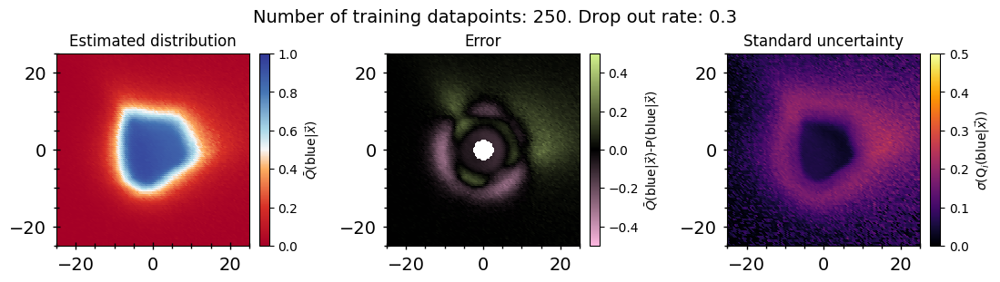

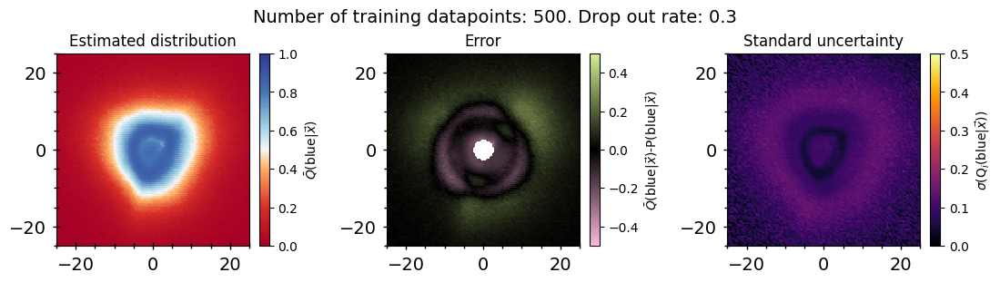

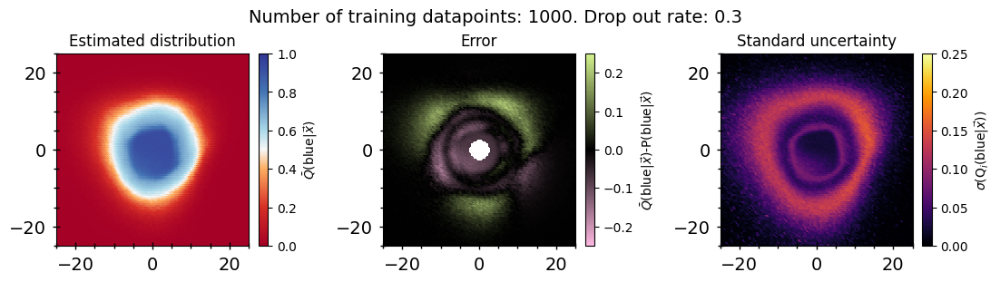

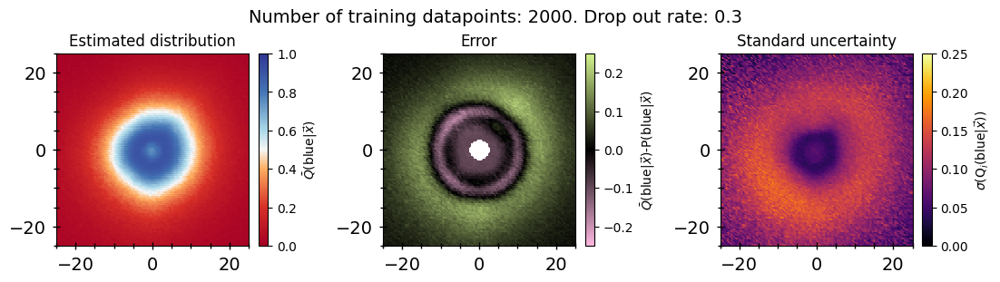

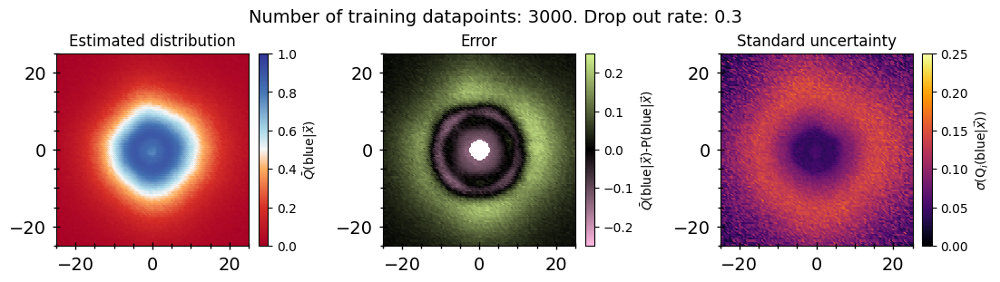

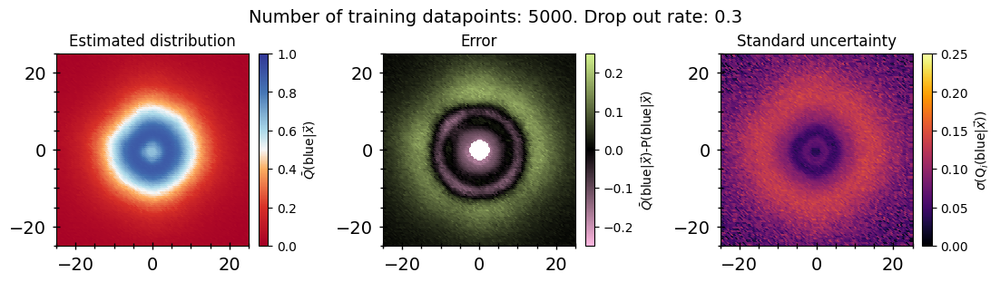

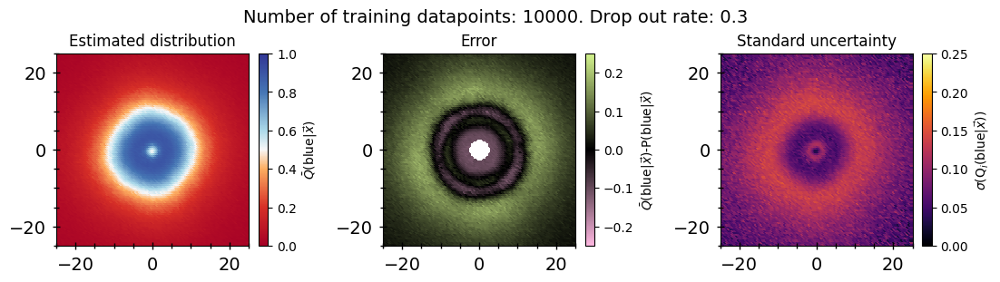

In [9]:
for i in range(len(n_data)):
    fig, axs = plt.subplots(nrows = 1, ncols = 3, figsize = (11,3), layout="constrained")
    axs[0] = plot_results(grid_dfs[i], "Confidence_MC", axs[0], "Estimated distribution", grid=True)
    hue_norm = mpl.colors.Normalize(vmin=0, vmax=1, clip=False)
    fig.colorbar(mpl.cm.ScalarMappable(norm=hue_norm, cmap=red_blue_cmap()), fraction=0.050, pad=0.04, 
                 label=r"$\bar{Q}$(blue|$\vec{x}$)", ax=axs[0])

    axs[1] = plot_diff(grid_dfs[i], truth_data, "Confidence_MC", "P_blue_given_x", axs[1], r"Error", max_val = max_err_val[i])
    hue_norm = mpl.colors.Normalize(vmin=-max_err_val[i], vmax=max_err_val[i], clip=False)
    fig.colorbar(mpl.cm.ScalarMappable(norm=hue_norm, cmap=pink_black_green_cmap()), fraction=0.050, pad=0.04, 
                 label=r"$\bar{Q}$(blue|$\vec{x}$)-P(blue|$\vec{x}$)", ax=axs[1])

    axs[2] = plot_std(grid_dfs[i], "Std_MC", axs[2], "Standard uncertainty", grid=True, max_val = max_err_val[i])
    
    hue_norm = mpl.colors.Normalize(vmin=0, vmax=max_err_val[i], clip=False)
    fig.colorbar(mpl.cm.ScalarMappable(norm=hue_norm, cmap="inferno"), fraction=0.050, pad=0.04, 
                 label=r"$\sigma$(Q$_i$(blue|$\vec{x}$))", ax=axs[2])

    #fig.savefig(f"../fig/MCD_ntrain_{n_data[i]}.pdf", format="pdf", bbox_inches='tight', dpi=350)
    fig.suptitle(f"Number of training datapoints: {n_data[i]}. Drop out rate: {drop_out_rate}", fontsize=14)

In [10]:
scores = calculate_metrics(test_dfs, grid_dfs, n_data, truth_data, truth_test_data, 
                           "Prediction_MC", "Confidence_MC", "Std_MC")
print(scores)

test_dfs_small = [df[0:1000] for df in test_dfs]
scores_small = calculate_metrics(test_dfs_small, grid_dfs, n_data, truth_data, truth_test_data, 
                           "Prediction_MC", "Confidence_MC", "Std_MC")
print(scores - scores_small)

   N data       ACC    ROCAUC   WD test   WD grid    Avg UE    Std UE  \
0     250  0.714471  0.805200  0.056705  0.032799  0.135249  0.046193   
1     500  0.722672  0.809818  0.067323  0.058091  0.103995  0.024739   
2    1000  0.739674  0.814809  0.035167  0.020778  0.079599  0.033122   
3    2000  0.726073  0.818059  0.077301  0.075634  0.115287  0.027684   
4    3000  0.739174  0.819813  0.069598  0.078513  0.106476  0.026091   
5    5000  0.738674  0.820355  0.065142  0.066925  0.105482  0.024739   
6   10000  0.740074  0.821337  0.063544  0.079133  0.110379  0.024976   

   Mean KL-div test  Mean KL-div grid   LogLoss       ECE       MCE     RMSCE  
0          0.028114          0.016812  0.540910  0.051746  0.127410  0.066137  
1          0.022734          0.026358  0.538334  0.058356  0.103992  0.065485  
2          0.018193          0.006439  0.522227  0.032465  0.066148  0.035144  
3          0.022708          0.039398  0.537075  0.079454  0.133488  0.087462  
4          0.02

### Results for MC dropout during training only

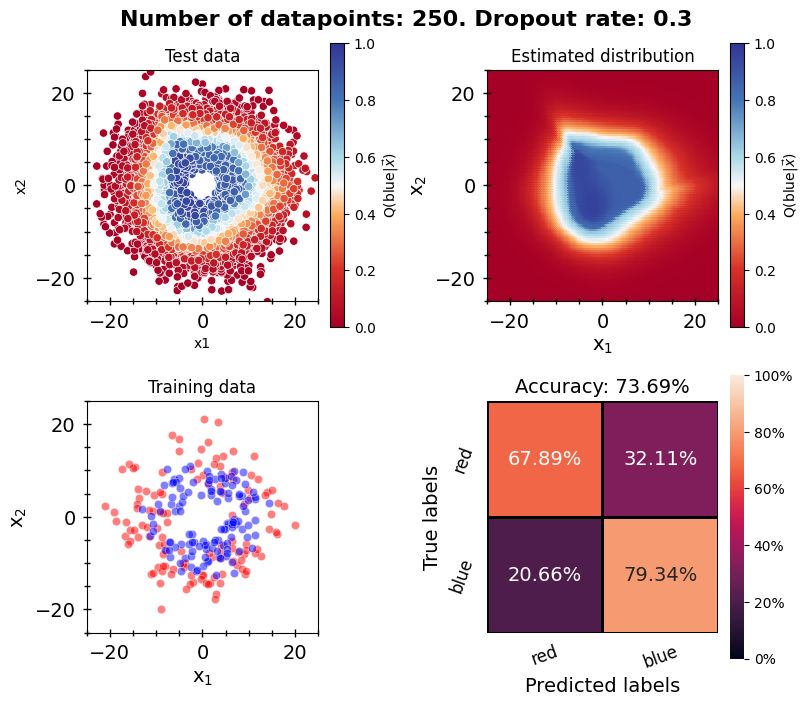

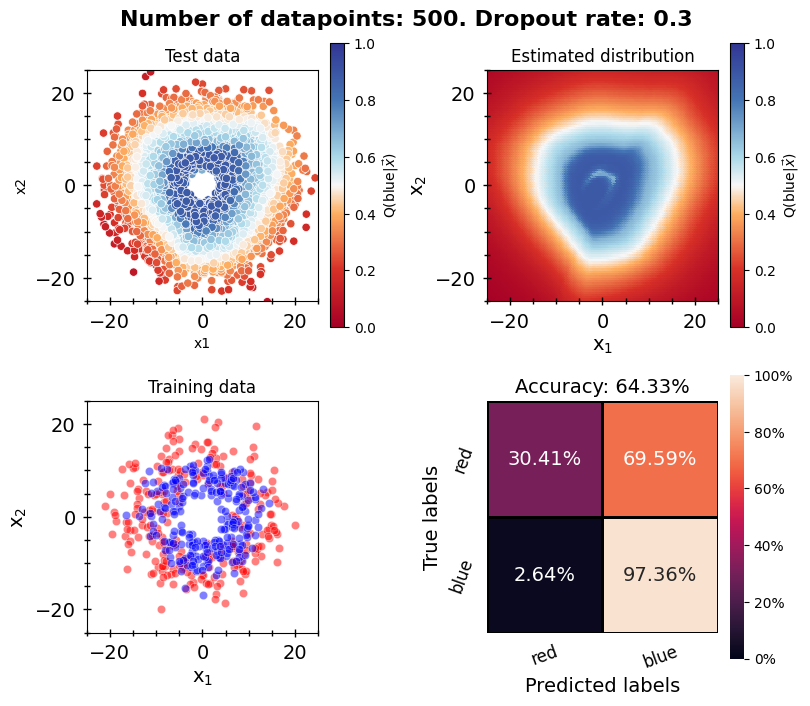

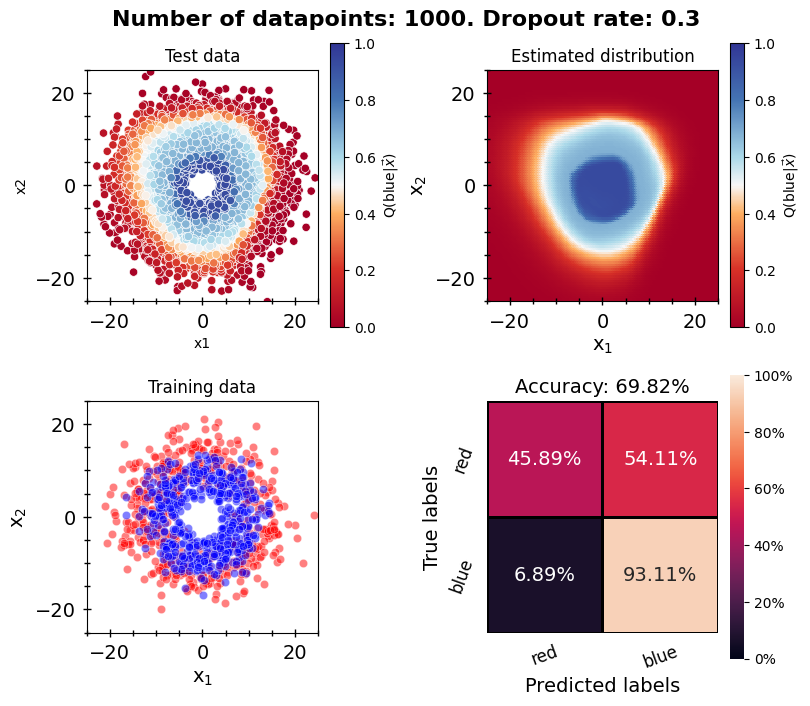

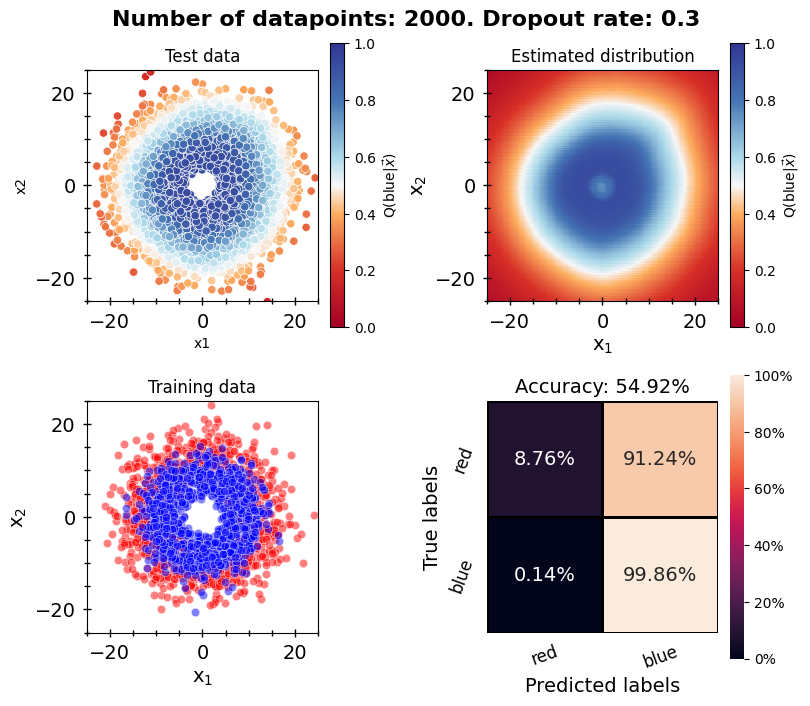

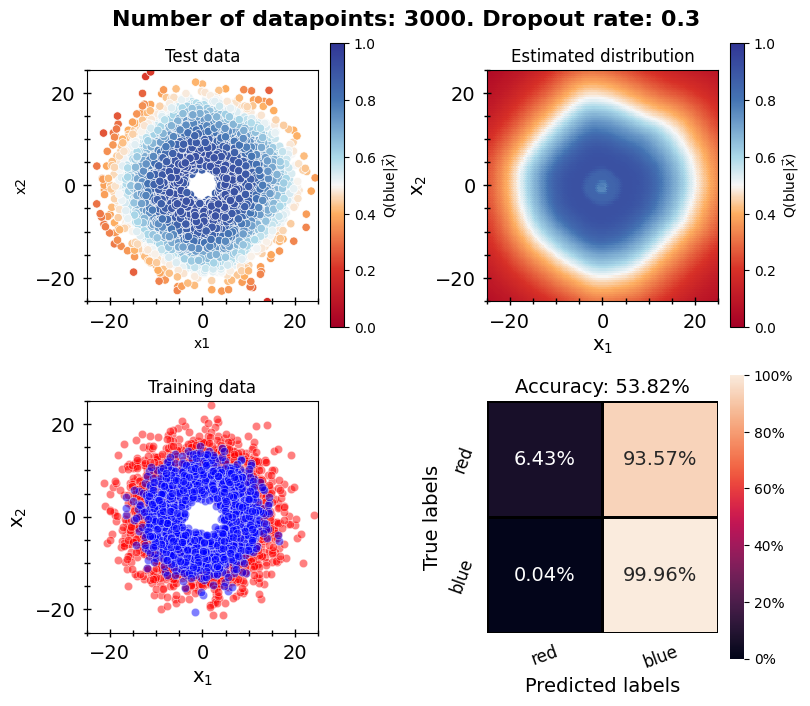

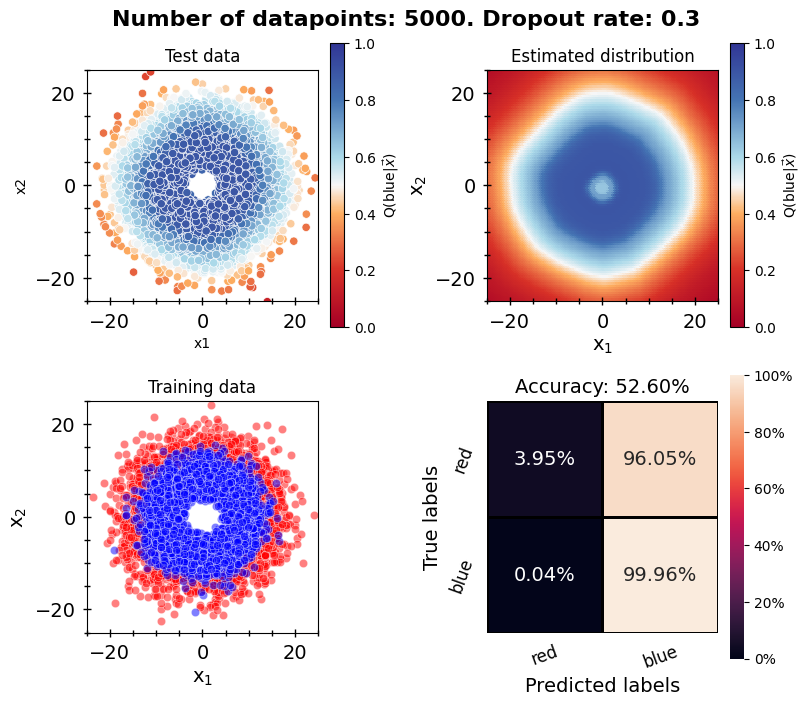

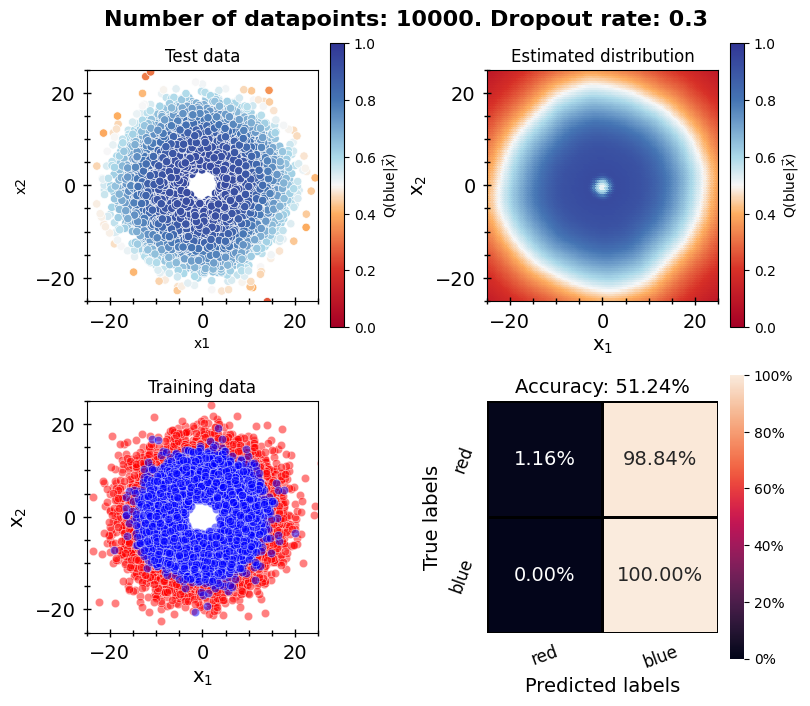

In [11]:

for i in range(len(n_data)):
    fig, axs = plt.subplots(nrows = 2, ncols = 2, figsize = (8, 7), layout="constrained")

    axs[0][0] = plot_results(test_dfs[i], "Confidence", axs[0][0], "Test data")
    axs[0][1] = plot_grid(grid_dfs[i], "Confidence", axs[0][1], "Estimated distribution")
    axs[1][1] = plot_conf_matrix(test_dfs[i], "class", "Prediction", ["red", "blue"], axs[1][1])
    axs[1][0] = plot_data(train_data[0:n_data[i]], axs[1][0], "Training data")

    cmap = red_blue_cmap()
    hue_norm = mpl.colors.Normalize(vmin=0, vmax=1, clip=False)
    fig.colorbar(mpl.cm.ScalarMappable(norm=hue_norm, cmap=cmap), label=r"Q(blue|$\vec{x}$)", ax=axs[0][0])
    fig.colorbar(mpl.cm.ScalarMappable(norm=hue_norm, cmap=cmap), label=r"Q(blue|$\vec{x}$)", ax=axs[0][1])

    fig.suptitle(f"Number of datapoints: {n_data[i]}. Dropout rate: {drop_out_rate}", size=16, fontweight="bold")

### Plot MC dropout during training and inference results

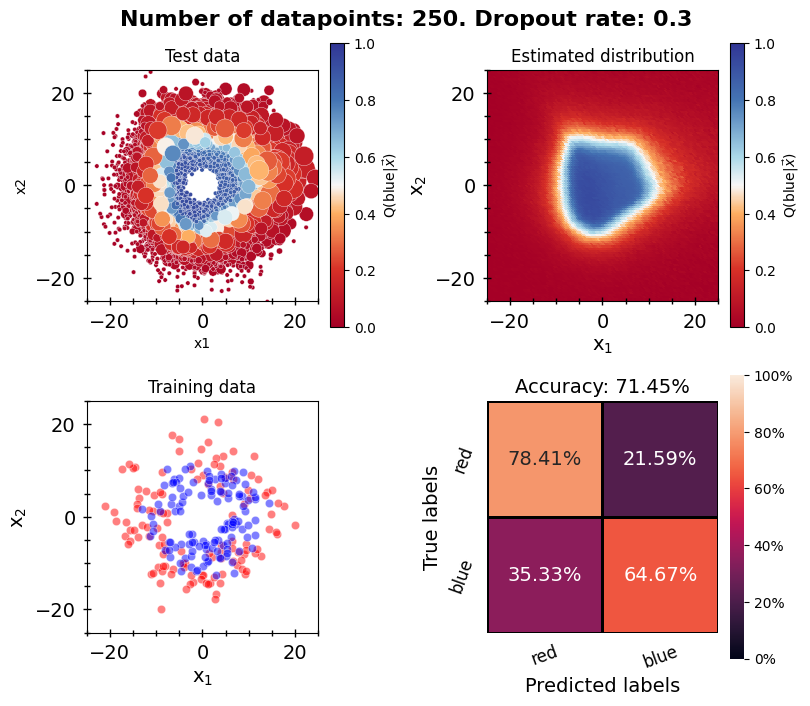

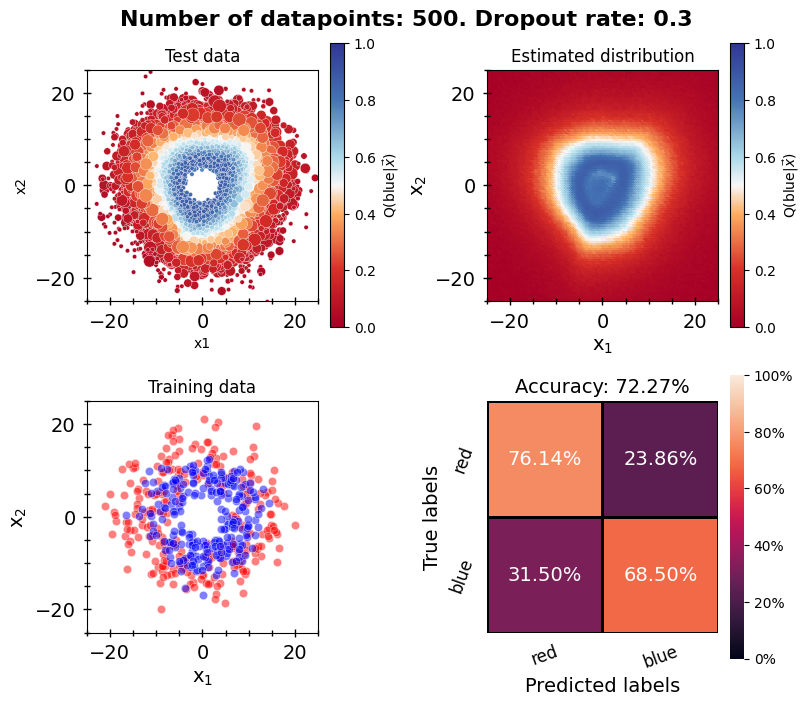

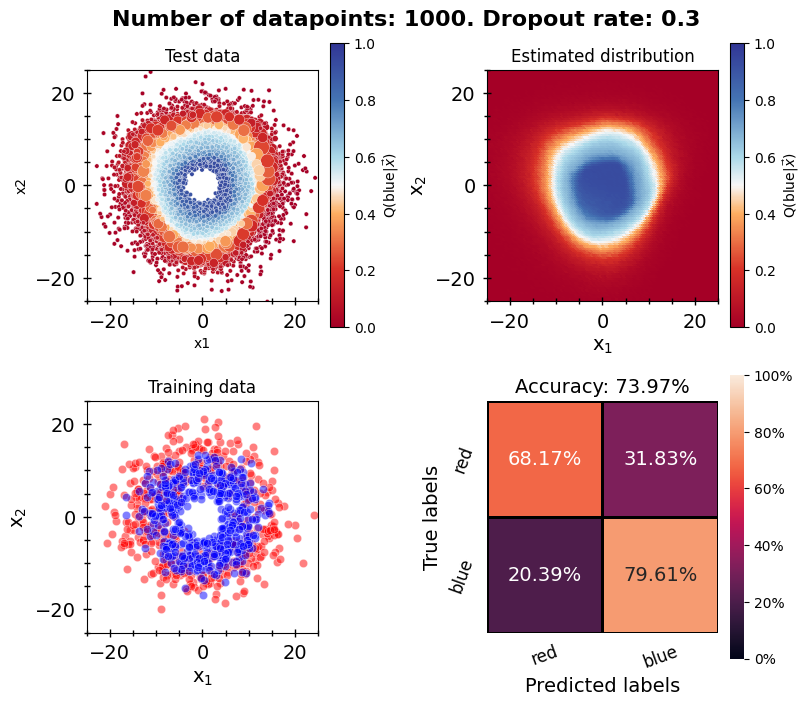

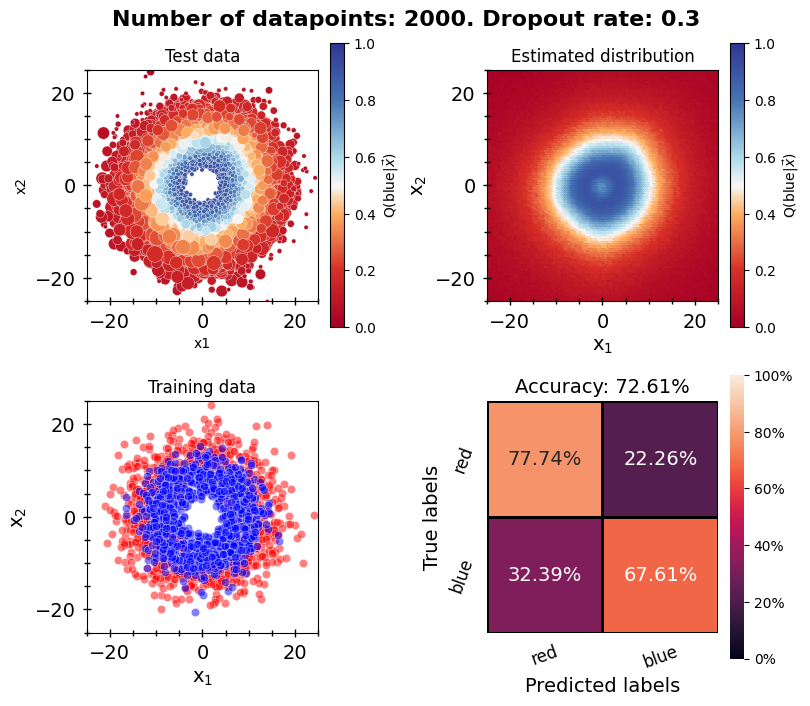

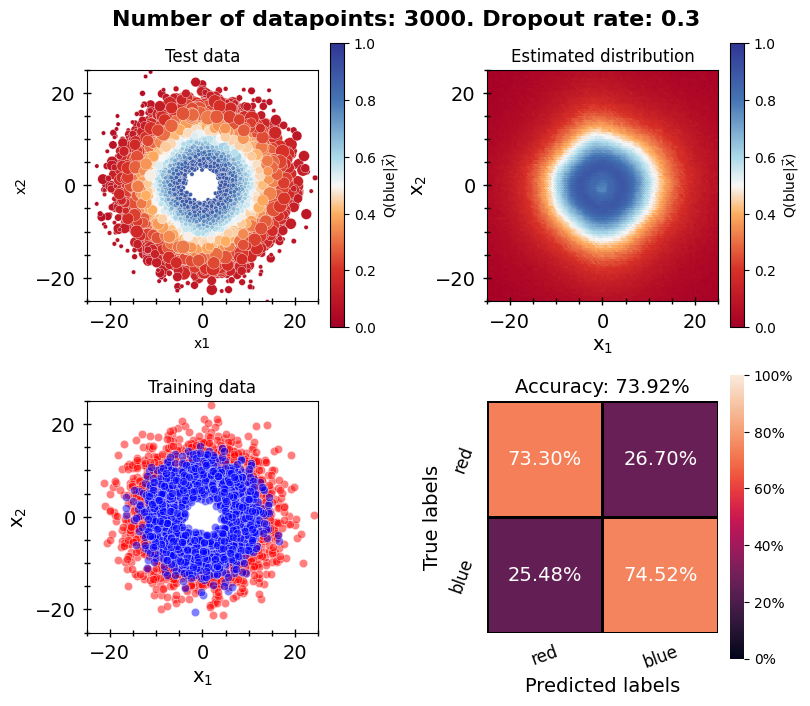

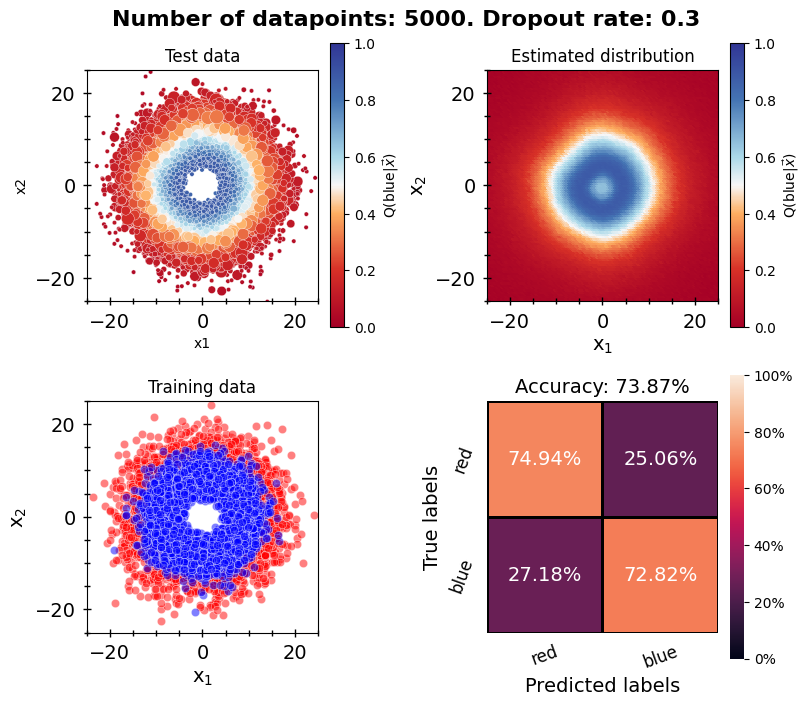

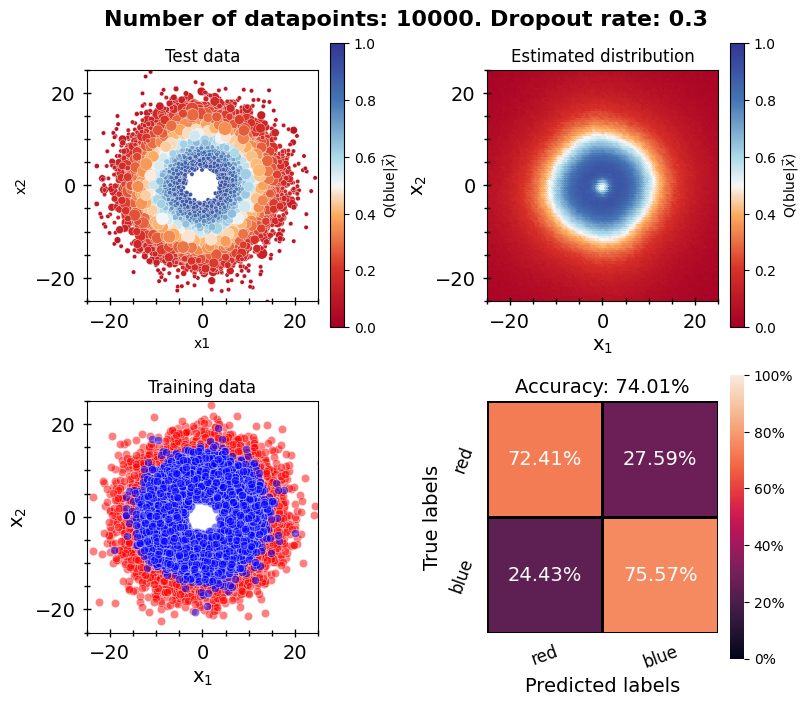

In [12]:
# Plot
for i in range(len(n_data)):
    fig, axs = plt.subplots(nrows = 2, ncols = 2, figsize = (8, 7), layout="constrained")

    axs[0][0] = plot_results(test_dfs[i], "Confidence_MC", axs[0][0], "Test data", error_key="Std_MC")
    axs[0][1] = plot_grid(grid_dfs[i], "Confidence_MC", axs[0][1], "Estimated distribution")
    axs[1][1] = plot_conf_matrix(test_dfs[i], "class", "Prediction_MC", ["red", "blue"], axs[1][1])
    axs[1][0] = plot_data(train_data[0:n_data[i]], axs[1][0], "Training data")

    cmap = red_blue_cmap()
    hue_norm = mpl.colors.Normalize(vmin=0, vmax=1, clip=False)
    fig.colorbar(mpl.cm.ScalarMappable(norm=hue_norm, cmap=cmap), label=r"Q(blue|$\vec{x}$)", ax=axs[0][0])
    fig.colorbar(mpl.cm.ScalarMappable(norm=hue_norm, cmap=cmap), label=r"Q(blue|$\vec{x}$)", ax=axs[0][1])

    fig.suptitle(f"Number of datapoints: {n_data[i]}. Dropout rate: {drop_out_rate}", size=16, fontweight="bold")


In [13]:
test_data

,color,x1,x2,a1,a2,r1,r2,r_x,a_x,class
0,red,4.637181,11.350187,0.935784,1.553757,11.837233,3,12.260921,1.182936,0
1,red,10.042744,10.382106,0.682262,0.612850,11.887063,3,14.444543,0.802012,0
2,blue,-5.605532,11.920284,1.943990,0.295500,10.273541,3,13.172515,2.010363,1
3,blue,-1.477669,-14.679668,4.577589,0.170343,11.788505,3,14.753853,4.612066,1
4,blue,-9.945727,8.379890,2.213879,1.781017,13.296149,3,13.005386,2.441433,1
...,...,...,...,...,...,...,...,...,...,...
9995,red,0.596807,9.253463,1.318706,2.526894,11.560692,3,9.272689,1.506390,0
9996,blue,-6.404741,6.863661,1.997287,1.496279,8.674995,3,9.387787,2.321621,1
9997,blue,-11.277142,2.093363,2.757517,0.865739,9.295702,3,11.469791,2.958053,1
9998,red,8.927445,11.836816,0.898653,3.012991,17.796208,3,14.825974,0.924606,0


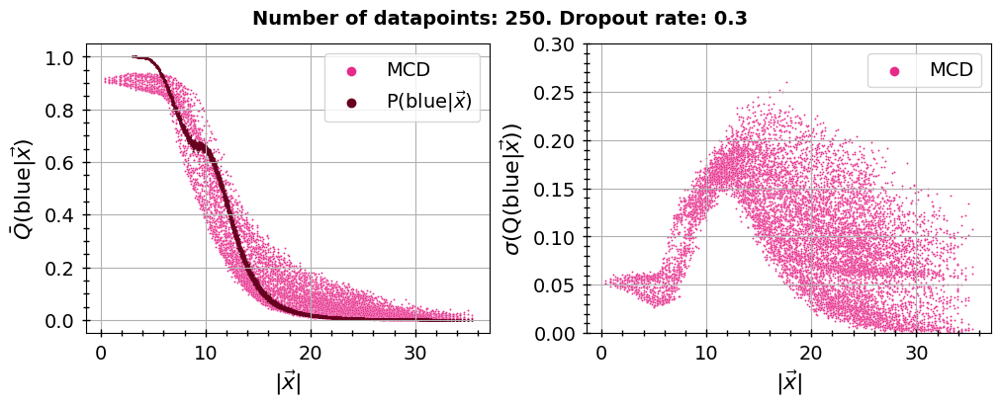

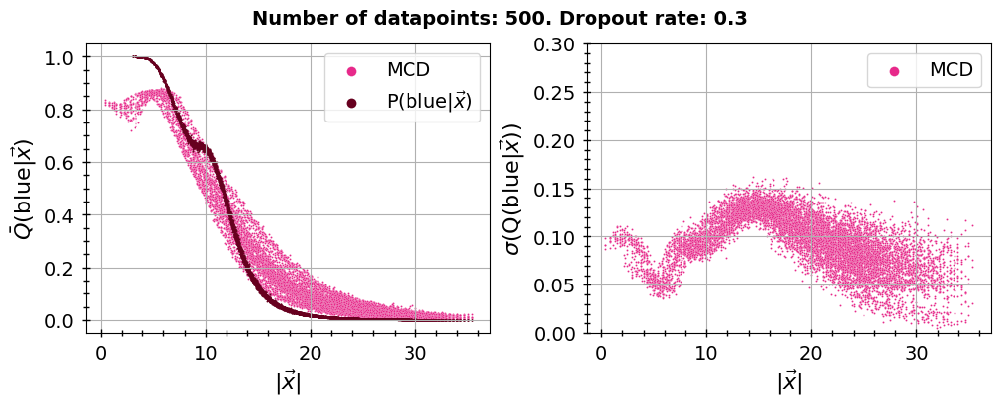

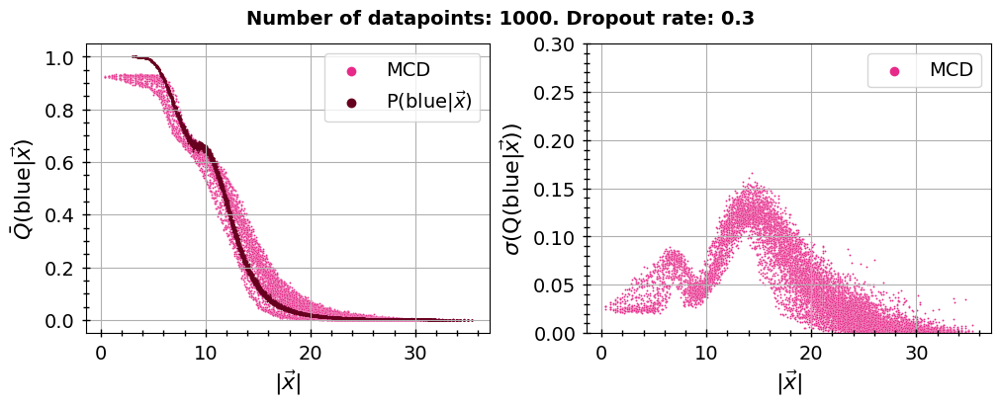

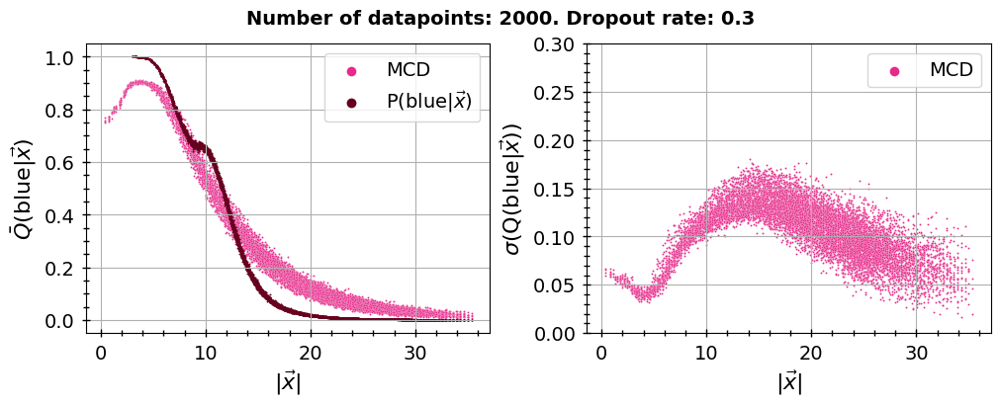

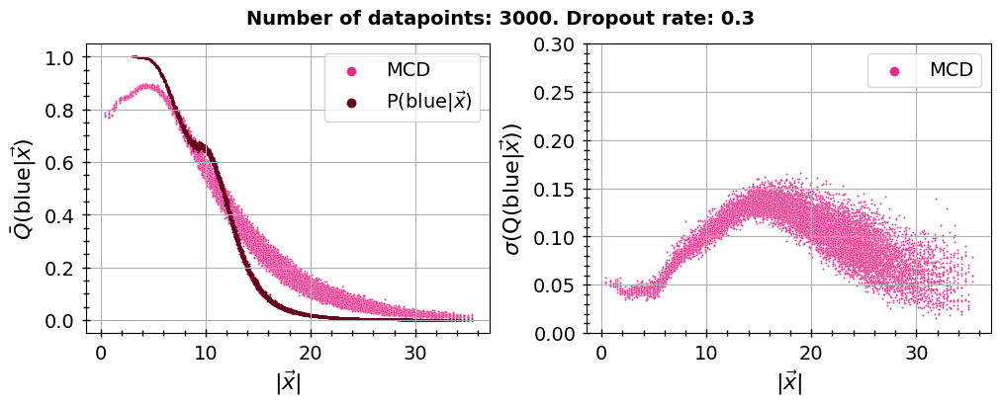

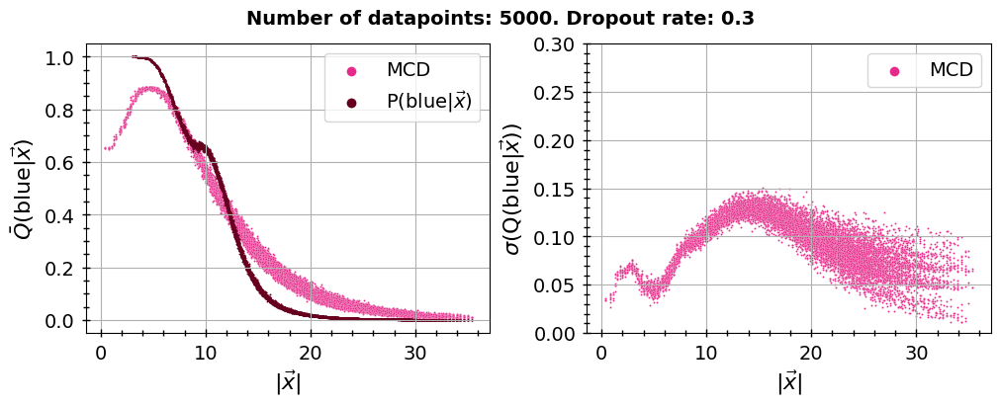

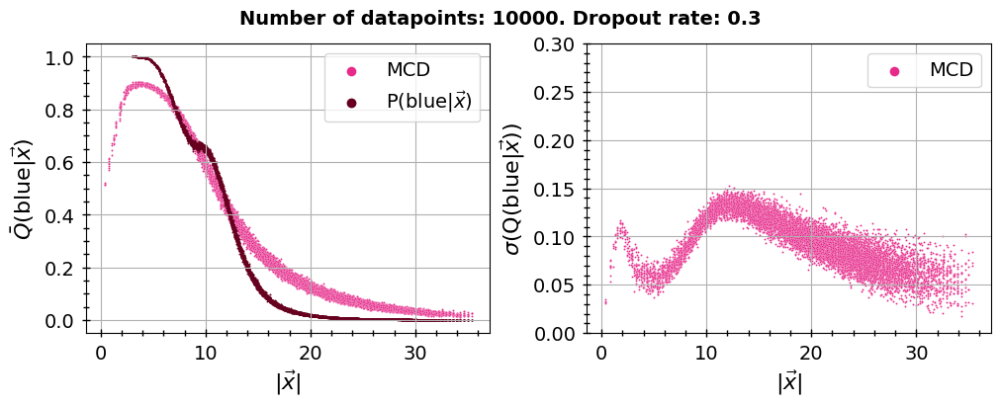

In [14]:
for i in range(len(n_data)):
    fig, axs = plt.subplots(nrows=1, ncols=2, figsize= (10, 4), layout="constrained")
    sn.scatterplot(grid_dfs[i], x="r_x", y="Confidence_MC", s=2, ax = axs[0], label="MCD", color="#e7298a")
    #sn.scatterplot(grid_dfs[i], x="r_x", y="Confidence_MC", s=2, ax = axs[0], label="Dropout train and pred", color="#762a83")
    sn.scatterplot(truth_data, x="r_x", y="P_blue_given_x", s=2, ax = axs[0], label=r"P(blue|$\vec{x}$)", color="#67001f", linewidth=0)
    axs[0].set_ylabel(r"$\bar{Q}$(blue|$\vec{x}$)", fontsize=16)

    sn.scatterplot(grid_dfs[i], x="r_x", y="Std_MC", s=2, ax = axs[1], label="MCD", color="#e7298a")
    axs[1].set_ylabel(r"$\sigma$(Q(blue|$\vec{x}$))", fontsize=16)
    axs[1].set_ylim(0, 0.3)

    for ax in axs:
        ax.legend(markerscale=5, fontsize=14)
        ax.set_xlabel(r"$|\vec{x}|$", fontsize=16)
        ax.tick_params(which="both", direction="inout", bottom=True, left=True, labelsize=14, pad=5, length=4, width=1)
        ax.tick_params(which="major", length=6)
        ax.minorticks_on()
        ax.grid()
    fig.suptitle(f"Number of datapoints: {n_data[i]}. Dropout rate: {drop_out_rate}", size=14, fontweight="bold")

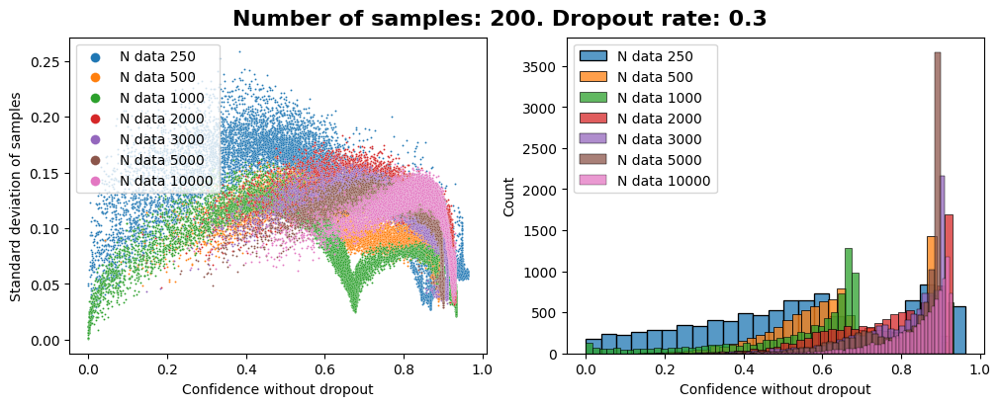

In [15]:
fig, axs = plt.subplots(nrows=1, ncols=2, figsize= (10, 4), layout="constrained")
for i in range(len(n_data)):
    sn.scatterplot(test_dfs[i], x="Confidence", y=f"Std_MC", s=2, label=f"N data {n_data[i]}", ax = axs[0])
    axs[0].legend(markerscale=5)
    axs[0].set_ylabel("Standard deviation of samples")
    axs[0].set_xlabel("Confidence without dropout")

    sn.histplot(test_dfs[i], x="Confidence", label=f"N data {n_data[i]}", ax = axs[1])
    axs[1].legend(markerscale=5)
    axs[1].set_ylabel("Count")
    axs[1].set_xlabel("Confidence without dropout")
    fig.suptitle(f"Number of samples: {200}. Dropout rate: {drop_out_rate}", size=16, fontweight="bold")

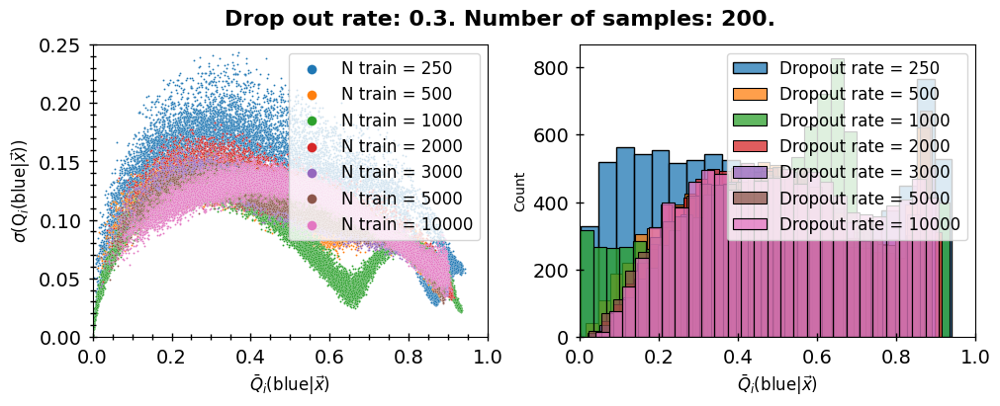

In [16]:
fig, axs = plt.subplots(nrows=1, ncols=2, figsize= (10, 4), layout="constrained")
for i in range(len(n_data)):
    sn.scatterplot(test_dfs[i], x="Confidence_MC", y="Std_MC", s=2, label=f"N train = {n_data[i]}", ax = axs[0])
    axs[0].legend(markerscale=5, fontsize=12)
    axs[0].set_ylabel(r"$\sigma$(Q$_i$(blue|$\vec{x}$))", fontsize=12)
    axs[0].set_xlabel(r"$\bar{Q}_i$(blue|$\vec{x}$)", fontsize=12)
    axs[0].set_xlim(0, 1)
    axs[0].set_ylim(0, 0.25)
    sn.histplot(test_dfs[i], x="Confidence_MC", label=f"Dropout rate = {n_data[i]}", ax = axs[1])
    axs[1].legend(markerscale=5, fontsize=12)
    axs[1].set_ylabel("Count")
    axs[1].set_xlabel(r"$\bar{Q}_i$(blue|$\vec{x}$)", fontsize=12)
    axs[1].set_xlim(0, 1)
    for ax in axs:
        ax.tick_params(which="both", direction="inout", bottom=True, left=True, labelsize=14, pad=5, length=4, width=1)
        ax.tick_params(which="major", length=6)
    axs[0].minorticks_on()
    fig.suptitle(f"Drop out rate: {drop_out_rate}. Number of samples: {n_MC}.", size=16, fontweight="bold")

### Try different drop out rates

In [17]:

#p_drop_out = [0.1, 0.2, 0.3, 0.4, 0.5]
p_drop_out = [0.1, 0.2, 0.3, 0.4, 0.5]
n_train = 5000
n_MC=200
test_dfs_DO = [0]*len(p_drop_out)
grid_dfs_DO = [0]*len(p_drop_out)

if load_values==False:
    for i in range(len(p_drop_out)):
        grid_dfs_DO[i] = pd.read_csv(f"../data/{gridfile}.csv")
        test_dfs_DO[i] = pd.read_csv(f"../data/{testfile}.csv")
        # Create datasets for pytorch
        train_dataset = torch.utils.data.TensorDataset(X_train[0:n_train], Y_train[0:n_train])

        # Create model
        model = SequentialNet(L=1024*2, n_hidden=5, activation="relu", in_channels=2, out_channels=2, p=p_drop_out[i]).to(device)
        optimizer = optim.Adam(model.parameters(), lr=0.001)

        # Train model
        training_results = train_classifier(model, train_dataset, 
                                val_dataset, batchsize=2**10, epochs = 250, 
                                device = device, optimizer = optimizer, early_stopping=patience)

        # Predict
        test_dfs_DO[i] = predict_MCD(model, test_dfs_DO[i], test_dataset, device, n_MC=n_MC)
        grid_dfs_DO[i] = predict_MCD(model, grid_dfs_DO[i], grid_dataset, device, n_MC=n_MC)

        # Save prediction
        if (not os.path.isdir(f"predictions/{trainfile}") ):
            os.mkdir(f"predictions/{trainfile}")
        test_dfs_DO[i].to_csv(f"predictions/{trainfile}/{testfile}_predicted_SequentialNet_MCD_Vpd{p_drop_out[i]}_nMC_{n_MC}_ndata-{n_train}.csv")
        grid_dfs_DO[i].to_csv(f"predictions/{trainfile}/grid_{tag}_predicted_SequentialNet_MCD_Vpd{p_drop_out[i]}_nMC_{n_MC}_ndata-{n_train}.csv")
else:
    for i in range(len(p_drop_out)):
    #val_data_ensembles = [pd.read_csv(f"predictions/{trainfile}/{valfile}_predicted_SequentialNet_{n_ensemble}ensembles_ndata-{n_data[i]}.csv") for i in range(len(n_data))]
        test_dfs_DO[i] = pd.read_csv(f"predictions/{trainfile}/{testfile}_predicted_SequentialNet_MCD_Vpd{p_drop_out[i]}_nMC_{n_MC}_ndata-{n_train}.csv")
        grid_dfs_DO[i] = pd.read_csv(f"predictions/{trainfile}/grid_{tag}_predicted_SequentialNet_MCD_Vpd{p_drop_out[i]}_nMC_{n_MC}_ndata-{n_train}.csv")

    

 35%|███▍      | 87/250 [01:05<02:02,  1.33it/s]


Stopping training early at epoch 87


100%|██████████| 100/100 [00:00<00:00, 452.41it/s]


Starting MC dropout inference: 


100%|██████████| 100/100 [00:00<00:00, 446.05it/s]


Starting MC dropout inference: 


 27%|██▋       | 67/250 [00:50<02:17,  1.33it/s]


Stopping training early at epoch 67


100%|██████████| 100/100 [00:00<00:00, 444.26it/s]


Starting MC dropout inference: 


100%|██████████| 100/100 [00:00<00:00, 446.39it/s]


Starting MC dropout inference: 


 24%|██▍       | 61/250 [00:45<02:22,  1.33it/s]


Stopping training early at epoch 61


100%|██████████| 100/100 [00:00<00:00, 448.18it/s]


Starting MC dropout inference: 


100%|██████████| 100/100 [00:00<00:00, 446.05it/s]


Starting MC dropout inference: 


 51%|█████     | 127/250 [01:35<01:32,  1.34it/s]


Stopping training early at epoch 127


100%|██████████| 100/100 [00:00<00:00, 450.75it/s]


Starting MC dropout inference: 


100%|██████████| 100/100 [00:00<00:00, 447.33it/s]


Starting MC dropout inference: 


 43%|████▎     | 107/250 [01:20<01:47,  1.34it/s]


Stopping training early at epoch 107


100%|██████████| 100/100 [00:00<00:00, 449.73it/s]


Starting MC dropout inference: 


100%|██████████| 100/100 [00:00<00:00, 448.05it/s]


Starting MC dropout inference: 


100%|██████████| 200/200 [00:35<00:00,  5.70it/s]


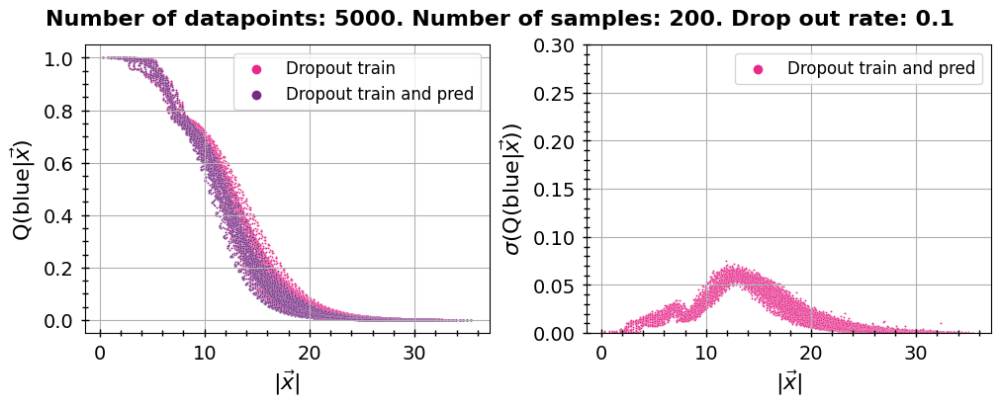

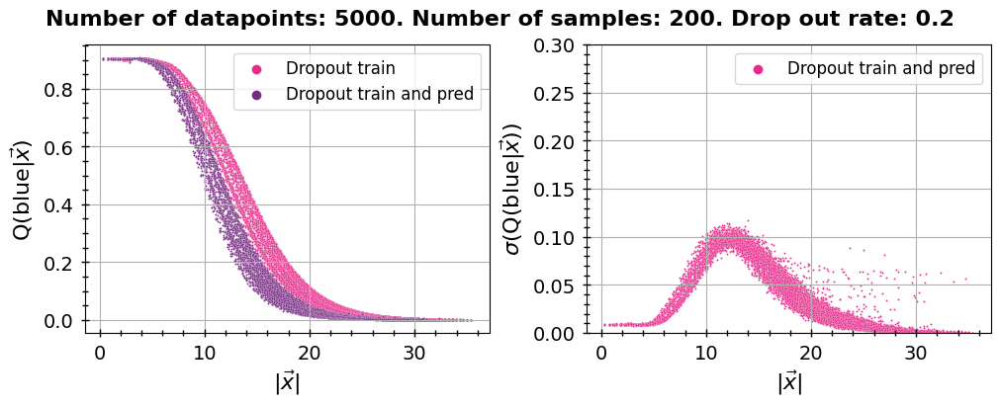

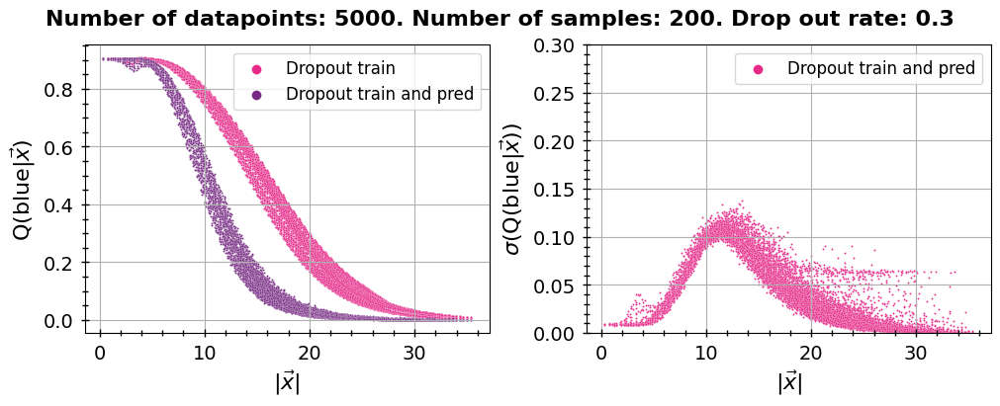

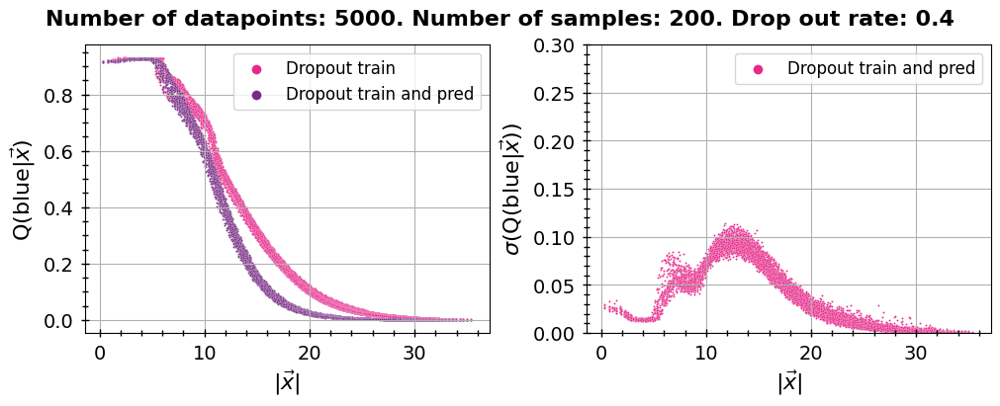

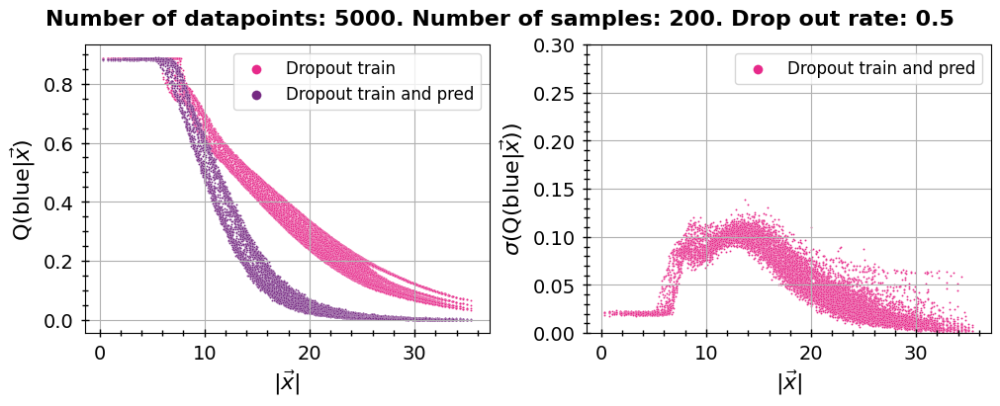

In [18]:
for i in range(len(p_drop_out)):
    fig, axs = plt.subplots(nrows=1, ncols=2, figsize= (10, 4), layout="constrained")
    sn.scatterplot(grid_dfs_DO[i], x="r_x", y="Confidence", s=2, ax = axs[0], label="Dropout train", color="#e7298a")
    sn.scatterplot(grid_dfs_DO[i], x="r_x", y="Confidence_MC", s=2, ax = axs[0], label="Dropout train and pred", color="#762a83")
    #sn.lineplot(truth_data, x="r_x", y="P_blue_given_x", linewidth=2, ax = axs[0], label="Generating function", color="#67001f")
    axs[0].set_ylabel(r"Q(blue|$\vec{x}$)", fontsize=16)

    sn.scatterplot(grid_dfs_DO[i], x="r_x", y="Std_MC", s=2, ax = axs[1], label="Dropout train and pred", color="#e7298a")
    axs[1].set_ylabel(r"$\sigma$(Q(blue|$\vec{x}$))", fontsize=16)
    axs[1].set_ylim(0, 0.3)

    for ax in axs:
        ax.legend(markerscale=5, fontsize=12)
        ax.set_xlabel(r"$|\vec{x}|$", fontsize=16)
        ax.tick_params(which="both", direction="inout", bottom=True, left=True, labelsize=14, pad=5, length=4, width=1)
        ax.tick_params(which="major", length=6)
        ax.minorticks_on()
        ax.grid()
    fig.suptitle(f"Number of datapoints: {n_train}. Number of samples: {n_MC}. Drop out rate: {p_drop_out[i]}", size=16, fontweight="bold")

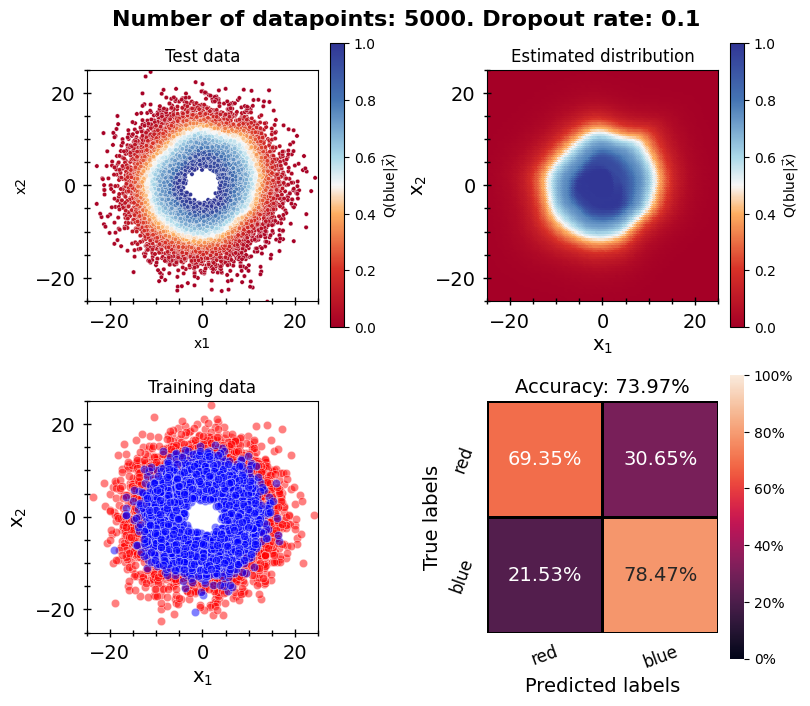

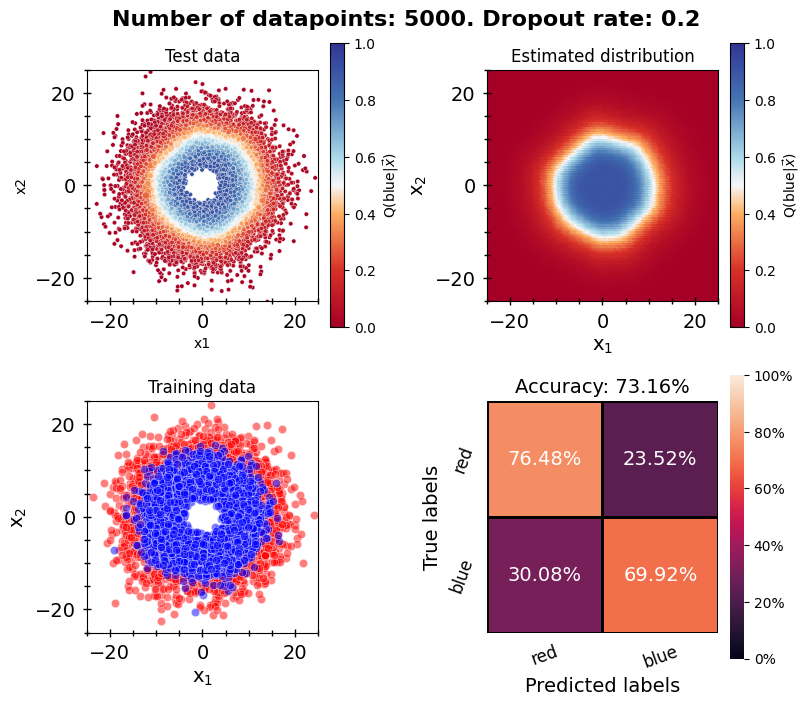

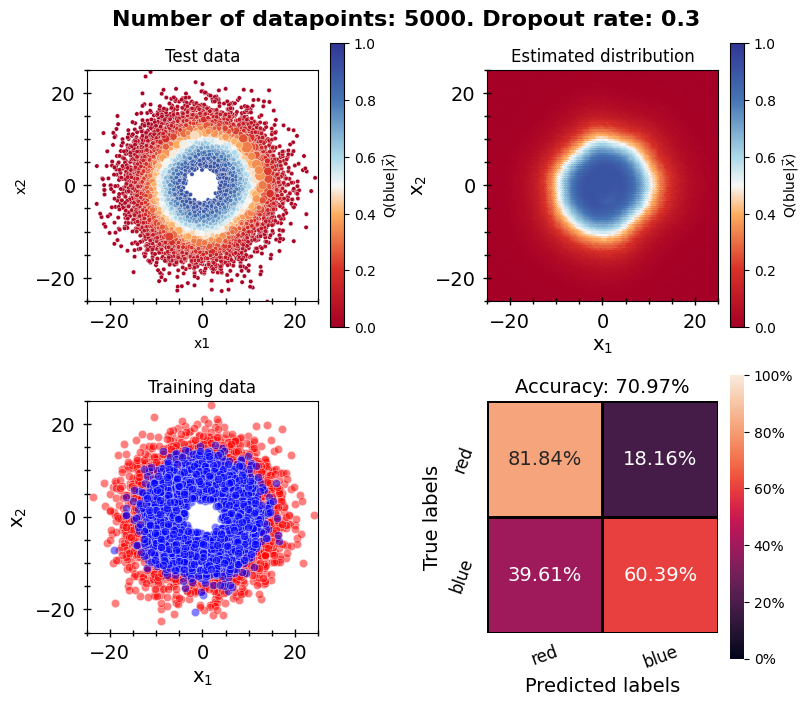

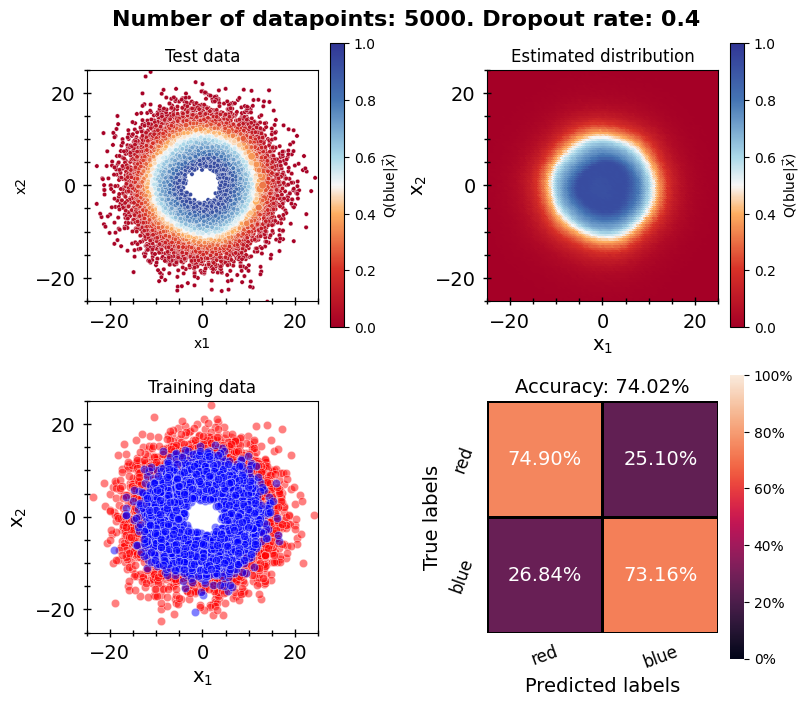

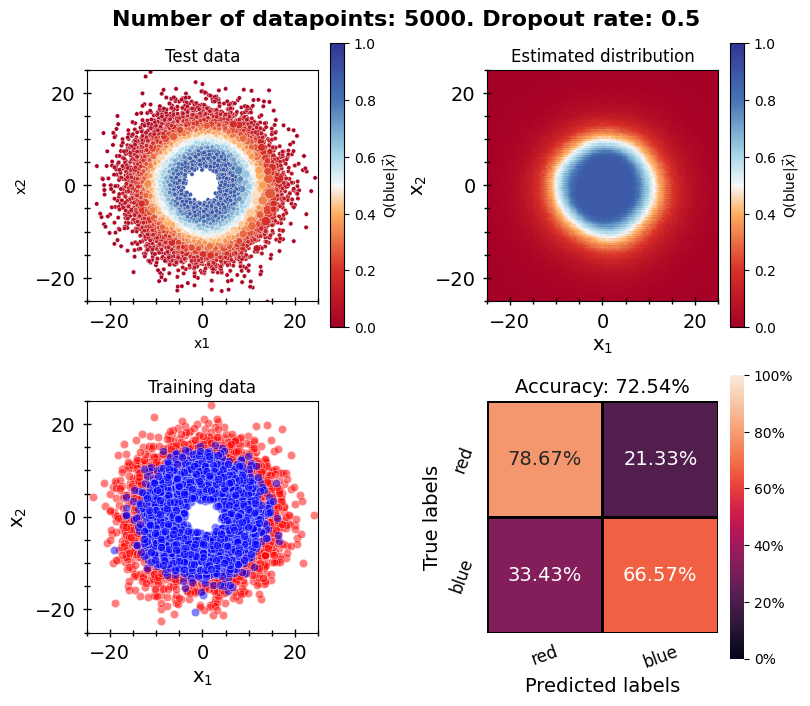

In [19]:
# Plot
for i in range(len(p_drop_out)):
    fig, axs = plt.subplots(nrows = 2, ncols = 2, figsize = (8, 7), layout="constrained")

    axs[0][0] = plot_results(test_dfs_DO[i], "Confidence_MC", axs[0][0], "Test data", error_key="Std_MC")
    axs[0][1] = plot_grid(grid_dfs_DO[i], "Confidence_MC", axs[0][1], "Estimated distribution")
    axs[1][1] = plot_conf_matrix(test_dfs_DO[i], "class", "Prediction_MC", ["red", "blue"], axs[1][1])
    axs[1][0] = plot_data(train_data[0:5000], axs[1][0], "Training data")

    cmap = red_blue_cmap()
    hue_norm = mpl.colors.Normalize(vmin=0, vmax=1, clip=False)
    fig.colorbar(mpl.cm.ScalarMappable(norm=hue_norm, cmap=cmap), label=r"Q(blue|$\vec{x}$)", ax=axs[0][0])
    fig.colorbar(mpl.cm.ScalarMappable(norm=hue_norm, cmap=cmap), label=r"Q(blue|$\vec{x}$)", ax=axs[0][1])

    fig.suptitle(f"Number of datapoints: {n_train}. Dropout rate: {p_drop_out[i]}", size=16, fontweight="bold")


### Standard deviation of MC dropout prediction

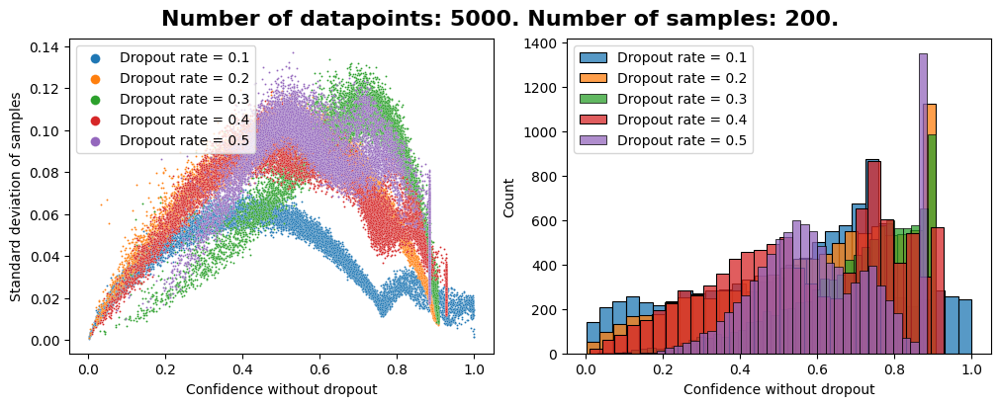

In [20]:
fig, axs = plt.subplots(nrows=1, ncols=2, figsize= (10, 4), layout="constrained")
for i in range(len(p_drop_out)):
    sn.scatterplot(test_dfs_DO[i], x="Confidence", y="Std_MC", s=2, label=f"Dropout rate = {p_drop_out[i]}", ax = axs[0])
    axs[0].legend(markerscale=5)
    axs[0].set_ylabel("Standard deviation of samples")
    axs[0].set_xlabel("Confidence without dropout")
    sn.histplot(test_dfs_DO[i], x="Confidence", label=f"Dropout rate = {p_drop_out[i]}", ax = axs[1])
    axs[1].legend(markerscale=5)
    axs[1].set_ylabel("Count")
    axs[1].set_xlabel("Confidence without dropout")
    fig.suptitle(f"Number of datapoints: {n_train}. Number of samples: {n_MC}.", size=16, fontweight="bold")

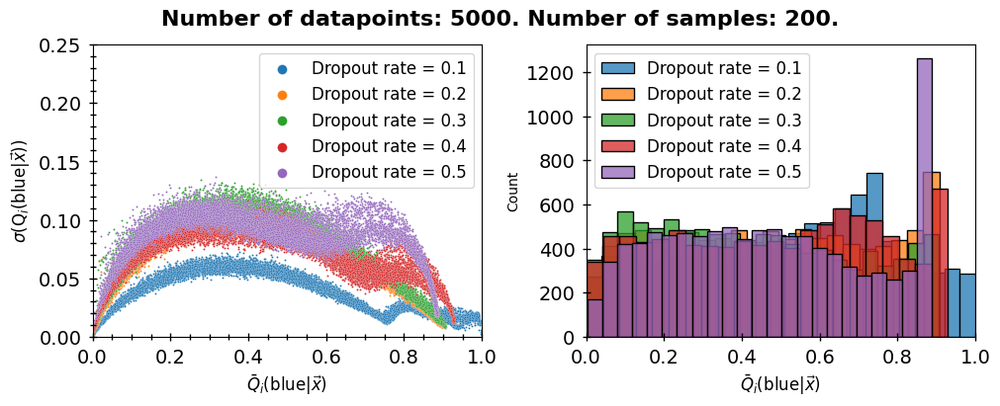

In [21]:
fig, axs = plt.subplots(nrows=1, ncols=2, figsize= (10, 4), layout="constrained")
for i in range(len(p_drop_out)):
    sn.scatterplot(test_dfs_DO[i], x="Confidence_MC", y="Std_MC", s=2, label=f"Dropout rate = {p_drop_out[i]}", ax = axs[0])
    axs[0].legend(markerscale=5, fontsize=12)
    axs[0].set_ylabel(r"$\sigma$(Q$_i$(blue|$\vec{x}$))", fontsize=12)
    axs[0].set_xlabel(r"$\bar{Q}_i$(blue|$\vec{x}$)", fontsize=12)
    axs[0].set_xlim(0, 1)
    axs[0].set_ylim(0, 0.25)
    sn.histplot(test_dfs_DO[i], x="Confidence_MC", label=f"Dropout rate = {p_drop_out[i]}", ax = axs[1])
    axs[1].legend(markerscale=5, fontsize=12)
    axs[1].set_ylabel("Count")
    axs[1].set_xlabel(r"$\bar{Q}_i$(blue|$\vec{x}$)", fontsize=12)
    axs[1].set_xlim(0, 1)
    for ax in axs:
        ax.tick_params(which="both", direction="inout", bottom=True, left=True, labelsize=14, pad=5, length=4, width=1)
        ax.tick_params(which="major", length=6)
    axs[0].minorticks_on()
    fig.suptitle(f"Number of datapoints: {n_train}. Number of samples: {n_MC}.", size=16, fontweight="bold")

In [22]:
n_MC_list = [10, 100, 1000]
n_train = 1000
drop_out_rate = 0.3
test_dfs_nMC = [0]*len(n_data)
grid_dfs_nMC = [0]*len(n_data)

if load_values==False:
    for i in range(len(p_drop_out)):
        grid_dfs_nMC[i] = pd.read_csv(f"../data/{gridfile}.csv")
        test_dfs_nMC[i] = pd.read_csv(f"../data/{testfile}.csv")
        # Create datasets for pytorch
        train_dataset = torch.utils.data.TensorDataset(X_train[0:n_train], Y_train[0:n_train])

        # Create model
        model = SequentialNet(L=1024*2, n_hidden=5, activation="relu", in_channels=2, out_channels=2, p=drop_out_rate).to(device)
        optimizer = optim.Adam(model.parameters(), lr=0.001)

        # Train model
        training_results = train_classifier(model, train_dataset, 
                                val_dataset, batchsize=2**10, epochs = 250, 
                                device = device, optimizer = optimizer, early_stopping=patience)

        # Predict
        test_dfs_nMC[i] = predict_MCD(model, test_dfs_nMC[i], test_dataset, device, n_MC=n_MC_list[i])
        grid_dfs_nMC[i] = predict_MCD(model, grid_dfs_nMC[i], grid_dataset, device, n_MC=n_MC_list[i])

        # Save prediction
        if (not os.path.isdir(f"predictions/{trainfile}") ):
            os.mkdir(f"predictions/{trainfile}")
        test_dfs_nMC[i].to_csv(f"predictions/{trainfile}/{testfile}_predicted_SequentialNet_MCD_pd{drop_out_rate}_VnMC_{n_MC_list[i]}_ndata-{n_train}.csv")
        grid_dfs_nMC[i].to_csv(f"predictions/{trainfile}/grid_{tag}_predicted_SequentialNet_MCD_pd{drop_out_rate}_VnMC_{n_MC_list[i]}_ndata-{n_train}.csv")
else:
    for i in range(len(n_MC_list)):
    #val_data_ensembles = [pd.read_csv(f"predictions/{trainfile}/{valfile}_predicted_SequentialNet_{n_ensemble}ensembles_ndata-{n_data[i]}.csv") for i in range(len(n_data))]
        test_dfs_nMC[i] = pd.read_csv(f"predictions/{trainfile}/{testfile}_predicted_SequentialNet_MCD_pd{drop_out_rate}_VnMC_{n_MC_list[i]}_ndata-{n_train}.csv")
        grid_dfs_nMC[i] = pd.read_csv(f"predictions/{trainfile}/grid_{tag}_predicted_SequentialNet_MCD_pd{drop_out_rate}_VnMC_{n_MC_list[i]}_ndata-{n_train}.csv")

    

 60%|█████▉    | 149/250 [00:22<00:15,  6.62it/s]


Stopping training early at epoch 149


100%|██████████| 100/100 [00:00<00:00, 450.19it/s]


Starting MC dropout inference: 


100%|██████████| 100/100 [00:00<00:00, 446.99it/s]


Starting MC dropout inference: 


 56%|█████▌    | 139/250 [00:20<00:16,  6.64it/s]


Stopping training early at epoch 139


100%|██████████| 100/100 [00:00<00:00, 452.03it/s]


Starting MC dropout inference: 


100%|██████████| 100/100 [00:00<00:00, 445.18it/s]


Starting MC dropout inference: 


 60%|█████▉    | 149/250 [00:22<00:15,  6.61it/s]


Stopping training early at epoch 149


100%|██████████| 100/100 [00:00<00:00, 447.18it/s]


Starting MC dropout inference: 


100%|██████████| 100/100 [00:00<00:00, 444.31it/s]


Starting MC dropout inference: 


 28%|██▊       | 69/250 [00:10<00:27,  6.51it/s]

Stopping training early at epoch 69


IndexError: list index out of range

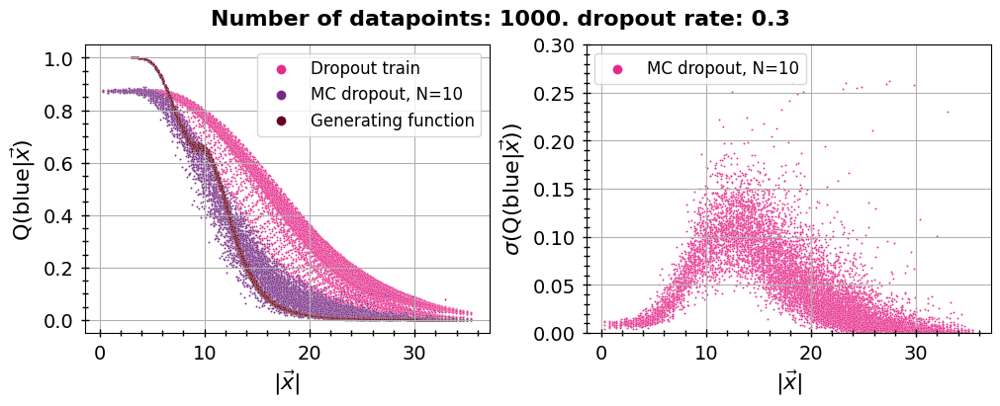

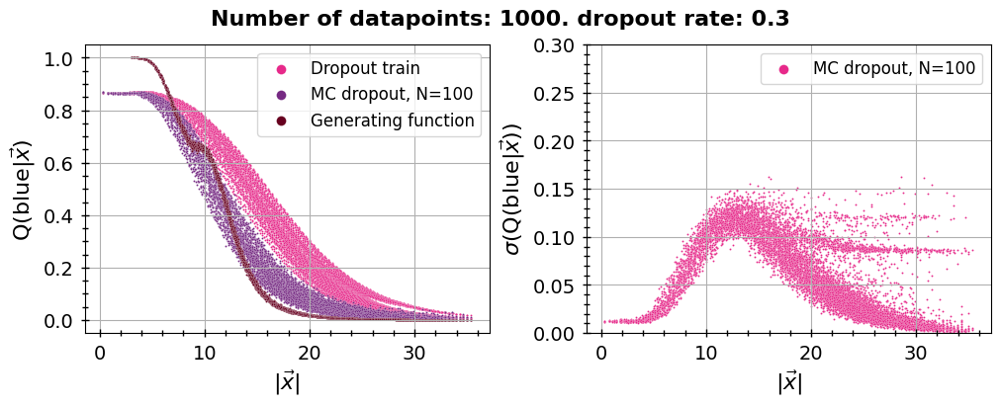

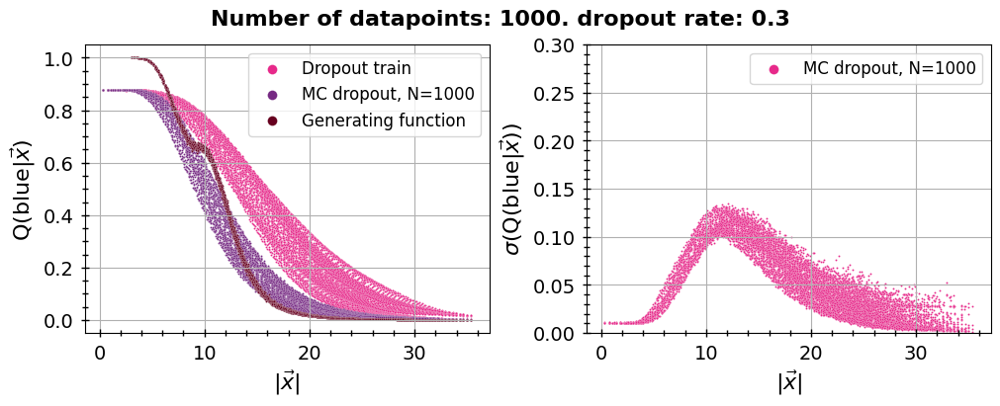

In [ ]:

for i in range(len(n_MC_list)):
    fig, axs = plt.subplots(nrows=1, ncols=2, figsize= (10, 4), layout="constrained")
    sn.scatterplot(grid_dfs_nMC[i], x="r_x", y=f"Confidence", s=2, ax = axs[0], label="Dropout train", color="#e7298a")
    sn.scatterplot(grid_dfs_nMC[i], x="r_x", y=f"Confidence_MC", s=2, ax = axs[0], label=f"MC dropout, N={n_MC_list[i]}", color="#762a83")
    sn.scatterplot(truth_data, x="r_x", y="P_blue_given_x", s=2, ax = axs[0], label="Generating function", color="#67001f")
    axs[0].set_ylabel(r"Q(blue|$\vec{x}$)", fontsize=16)

    sn.scatterplot(grid_dfs_nMC[i], x="r_x", y=f"Std_MC", s=2, ax = axs[1], label=f"MC dropout, N={n_MC_list[i]}", color="#e7298a")
    axs[1].set_ylabel(r"$\sigma$(Q(blue|$\vec{x}$))", fontsize=16)
    axs[1].set_ylim(0, 0.3)

    for ax in axs:
        ax.legend(markerscale=5, fontsize=12)
        ax.set_xlabel(r"$|\vec{x}|$", fontsize=16)
        ax.tick_params(which="both", direction="inout", bottom=True, left=True, labelsize=14, pad=5, length=4, width=1)
        ax.tick_params(which="major", length=6)
        ax.minorticks_on()
        ax.grid()
    fig.suptitle(f"Number of datapoints: {n_train}. dropout rate: {drop_out_rate}", size=16, fontweight="bold")

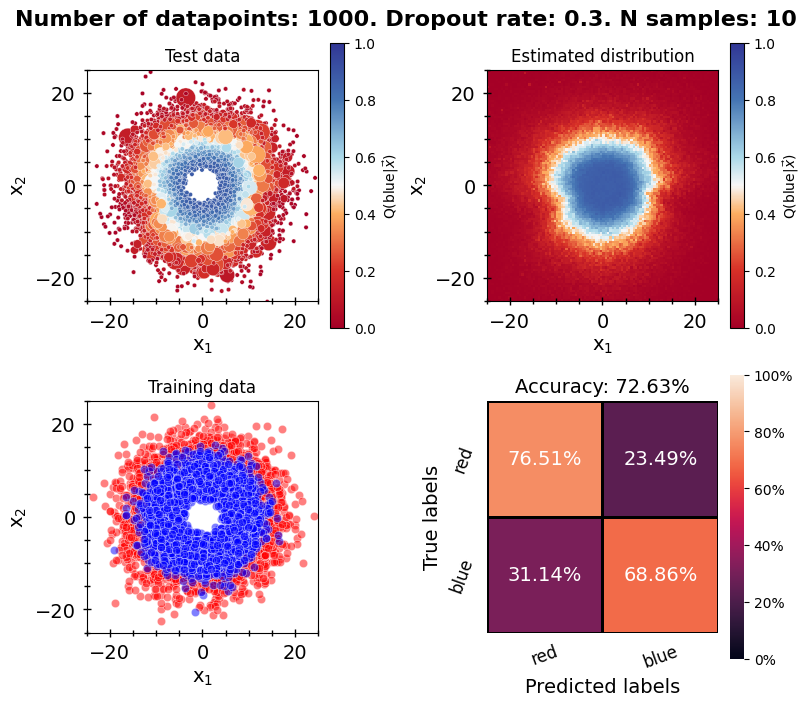

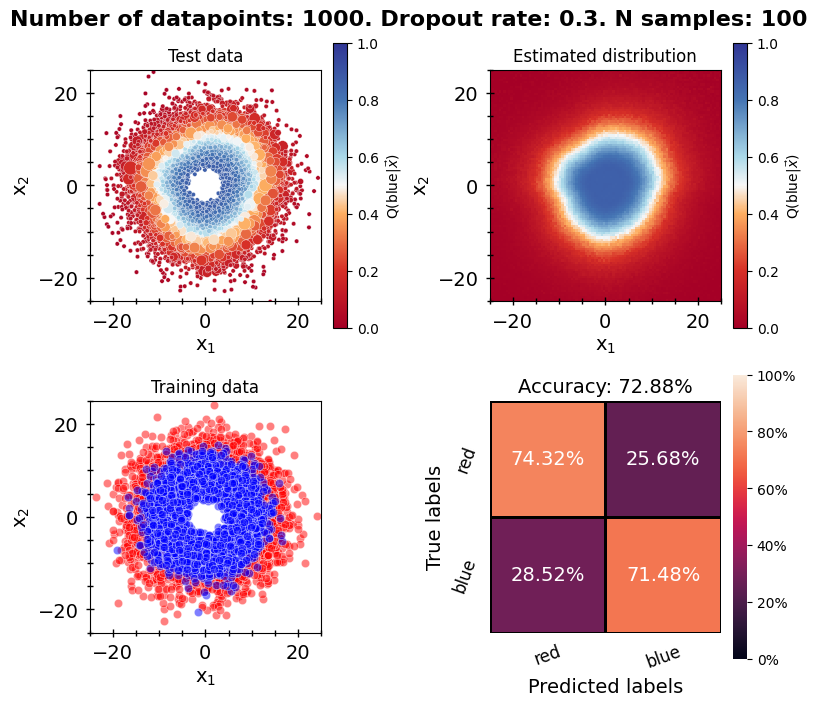

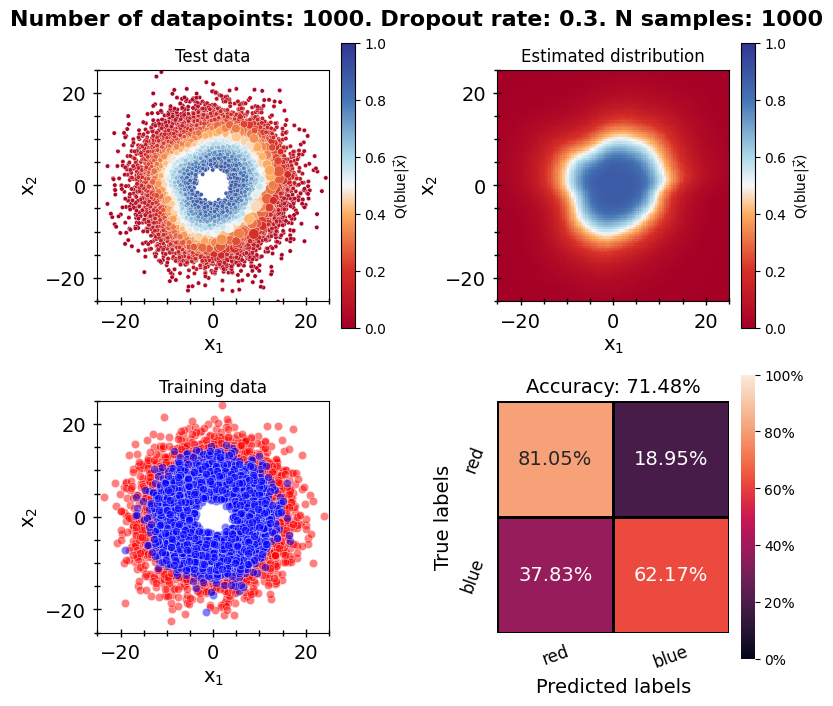

In [ ]:
# Plot
for i in range(len(n_MC_list)):
    fig, axs = plt.subplots(nrows = 2, ncols = 2, figsize = (8, 7), layout="constrained")

    axs[0][0] = plot_results(test_dfs_nMC[i], f"Confidence_MC", axs[0][0], "Test data", error_key=f"Std_MC")
    axs[0][1] = plot_grid(grid_dfs_nMC[i], f"Confidence_MC", axs[0][1], "Estimated distribution")
    axs[1][1] = plot_conf_matrix(test_dfs_nMC[i], "class", f"Prediction_MC", ["red", "blue"], axs[1][1])
    axs[1][0] = plot_data(train_data[0:5000], axs[1][0], "Training data")

    cmap = red_blue_cmap()
    hue_norm = mpl.colors.Normalize(vmin=0, vmax=1, clip=False)
    fig.colorbar(mpl.cm.ScalarMappable(norm=hue_norm, cmap=cmap), label=r"Q(blue|$\vec{x}$)", ax=axs[0][0])
    fig.colorbar(mpl.cm.ScalarMappable(norm=hue_norm, cmap=cmap), label=r"Q(blue|$\vec{x}$)", ax=axs[0][1])

    fig.suptitle(f"Number of datapoints: {n_train}. Dropout rate: {drop_out_rate}. N samples: {n_MC_list[i]}", size=16, fontweight="bold")


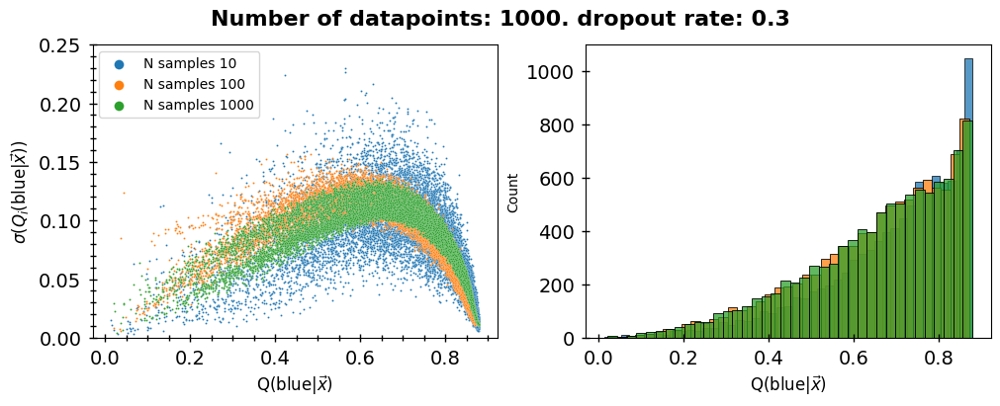

In [ ]:
fig, axs = plt.subplots(nrows=1, ncols=2, figsize= (10, 4), layout="constrained")
for i in range(len(n_MC_list)):
    sn.scatterplot(test_dfs_nMC[i], x="Confidence", y=f"Std_MC", s=2, label=f"N samples {n_MC_list[i]}", ax = axs[0])
    axs[0].legend(markerscale=5)
    axs[0].set_ylabel(r"$\sigma$($Q_i$(blue|$\vec{x}$))", fontsize=12)
    axs[0].set_xlabel(r"Q(blue|$\vec{x}$)", fontsize=12)
    axs[0].set_ylim(0, 0.25)

    sn.histplot(test_dfs_nMC[i], x="Confidence", ax = axs[1])
    axs[1].set_ylabel("Count")
    axs[1].set_xlabel(r"Q(blue|$\vec{x}$)", fontsize=12)

    for ax in axs:
        ax.tick_params(which="both", direction="inout", bottom=True, left=True, labelsize=14, pad=5, length=4, width=1)
        ax.tick_params(which="major", length=6)
    axs[0].minorticks_on()
    fig.suptitle(f"Number of datapoints: {n_train}. dropout rate: {drop_out_rate}", size=16, fontweight="bold")

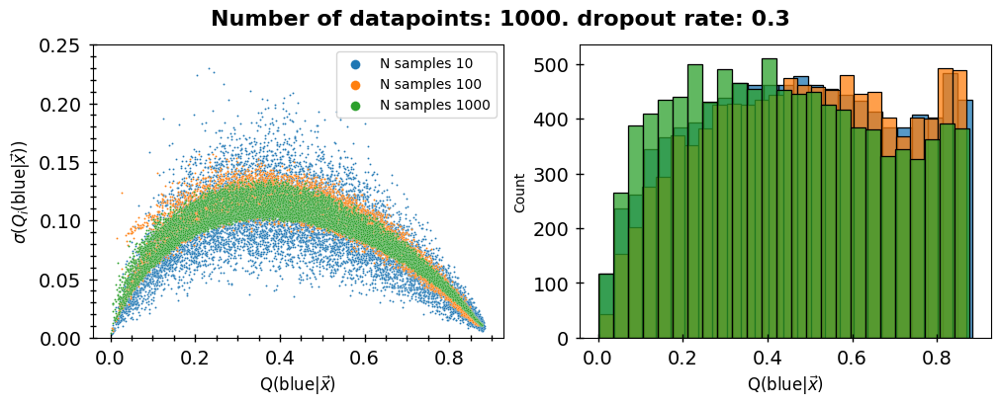

In [ ]:
fig, axs = plt.subplots(nrows=1, ncols=2, figsize= (10, 4), layout="constrained")
for i in range(len(n_MC_list)):
    sn.scatterplot(test_dfs_nMC[i], x="Confidence_MC", y=f"Std_MC", s=2, label=f"N samples {n_MC_list[i]}", ax = axs[0])
    axs[0].legend(markerscale=5)
    axs[0].set_ylabel(r"$\sigma$($Q_i$(blue|$\vec{x}$))", fontsize=12)
    axs[0].set_xlabel(r"Q(blue|$\vec{x}$)", fontsize=12)
    axs[0].set_ylim(0, 0.25)

    sn.histplot(test_dfs_nMC[i], x="Confidence_MC", ax = axs[1])
    axs[1].set_ylabel("Count")
    axs[1].set_xlabel(r"Q(blue|$\vec{x}$)", fontsize=12)

    for ax in axs:
        ax.tick_params(which="both", direction="inout", bottom=True, left=True, labelsize=14, pad=5, length=4, width=1)
        ax.tick_params(which="major", length=6)
    axs[0].minorticks_on()
    fig.suptitle(f"Number of datapoints: {n_train}. dropout rate: {drop_out_rate}", size=16, fontweight="bold")